<a href="https://colab.research.google.com/github/AurelioMurolo/University-Projects/blob/main/Tweets_Analysis_for_HateSpeech_Classification_AurelioMurolo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Credits

- **Aurelio Murolo**
- **Matricola** : *D03000086*
- Techniques of Text analysis and Computational Linguistic course a.a  *2024/2025*
- Professor **[Francesco Cutugno](https://www.docenti.unina.it/#!/professor/4652414e434553434f43555455474e4f435447464e4336304d31364638333948/riferimenti)**
- Assistant professor **Luigi Maria Giordano** .

# Text to Vector Methodologies



Here are the most basic models used to represent tokens in numerical form:

  * N-grams: This approach counts the frequency of individual tokens (unigrams) or sequences of tokens in groups, such as bi-grams, tri-grams, and so on. ([Jurafsky and Martin chap. 3](https://web.stanford.edu/~jurafsky/slp3/))

  * Bag of Words (BoW): This is the simplest method for converting tokens into numeric form by representing the presence or absence of words in a document, without considering their order. (Jurafsky and Martin chap.4 and at
 [https://en.wikipedia.org/wiki/Bag-of-words_model](https://en.wikipedia.org/wiki/Bag-of-words_model))

  * TF-IDF : the term frequency - inverse document frequency is a statistical measure that represent the weighted product between the two previous components and is another simple way to give a vector representation of documents in a corpus.  It is used to evaluate the importance of a word in a document relative to a corpus. (Jurafsky and Martin chap.6 and at
 [https://en.wikipedia.org/wiki/Tf%E2%80%93idf](https://en.wikipedia.org/wiki/Tf%E2%80%93idf))

# How to run the Colab File
If you have the free google colab plan, follow these instructions to run the code till the Classification Models Results, otherwise the RAM will not be enough and the runtime will be disconnected.

1. Run all the **Data pre-processing** section ;
2. Run all the **Text Cleaning** section ;
3. Now you can Run the **Classification Models** section .


# **HomeWork Assignment**

Using the *Italian Hate Speech Corpus (IHSC)* try to implement various type of classifiers according on what was shown during the Python Practices.
Some helpful references:



*   For the dataset the [github repository](https://github.com/msang/hate-speech-corpus) and the [reference paper](https://aclanthology.org/L18-1443/)

*   For the logistic regression refer to the Scikit-learn documentation at [link](https://scikit-learn.org/1.5/modules/generated/sklearn.linear_model.LogisticRegression.html)

*   For the Naive Bayes classifier refer to [Scikit-learn documentation](https://scikit-learn.org/1.5/modules/naive_bayes.html) or [NLTK documentation](https://www.nltk.org/book/ch06.html)

*    For the metrics refer also to [Scikit-learn documentation](https://scikit-learn.org/1.5/modules/model_evaluation.html) or [NLTK documentation](https://www.nltk.org/book/ch06.html)



In [ ]:
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import itertools
import pandas as pd

from tabulate import tabulate # Output readble
from sklearn.metrics import jaccard_score

In [ ]:
uploaded = files.upload()

Saving haspeede2_dev_taskAB.tsv to haspeede2_dev_taskAB.tsv


In [ ]:
text_df = pd.read_csv('/content/haspeede2_dev_taskAB.tsv', sep = '\t')
text_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6837 entries, 0 to 6836
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   id          6837 non-null   int64 
 1   text        6837 non-null   object
 2   hs          6837 non-null   int64 
 3   stereotype  6837 non-null   int64 
dtypes: int64(3), object(1)
memory usage: 213.8+ KB


## Data pre-processing

* **HS** stands for **Hate speech** ;
* **Stereotype**
  - Determines whether the message contains references
(implicit or explicit) to, or is based on, negative ideas or traits generically attributed to the entire group. In some cases, stereotypes may be at the basis of discourses that promote or convey hatred towards certain minority groups.

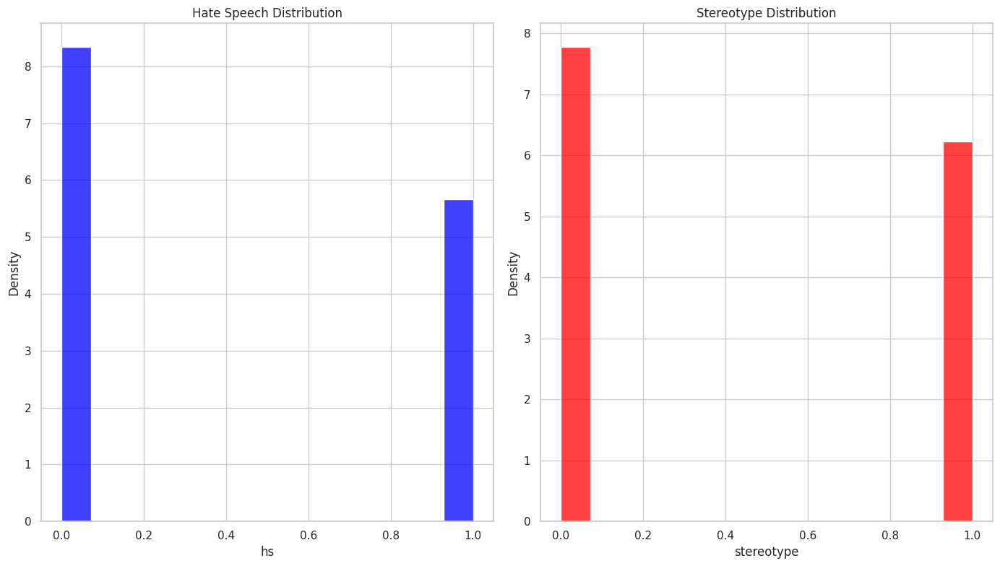

In [ ]:
sns.set(style="whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(14, 8))

# 1 Plot
sns.histplot(data = text_df, x = "hs", kde = False, stat = "density", ax=axes[0], color='blue')
axes[0].set_title("Hate Speech Distribution")

# 2 Plot
sns.histplot(data = text_df, x = "stereotype", kde = False, stat = "density", ax=axes[1], color='red')
axes[1].set_title("Stereotype Distribution")


plt.tight_layout()
plt.show()

### Probabilities

In [ ]:
N = len(text_df) # Normalization Factor

#### Marginal Probabilities

In [ ]:
# Hate Speech Marginal Probabilities
n1_hs = (text_df['hs'] == 1).sum()
p1_hs = n1_hs/N

n0_hs = (text_df['hs'] == 0).sum()
p0_hs = n0_hs/N

# Stereotypes Marginal Probabilities
n1_st = (text_df['stereotype'] == 1).sum()
p1_st = n1_st/N

n0_st = (text_df['stereotype'] == 0).sum()
p0_st = n0_st/N

In [ ]:
hs_distributions = (text_df['hs'].value_counts(normalize=True) * 100).round(2)
st_distribution = (text_df['stereotype'].value_counts(normalize=True) * 100).round(2)

In [ ]:
hs_distributions

,proportion
hs,
0,59.54
1,40.46


In [ ]:
st_distribution

,proportion
stereotype,
0,55.52
1,44.48


#### Joint Probabilities

Then, in order to better understand the *behaviour* of HS & Steriotype,
 i'm going to evaluate the following  **joint probabilities** :
 1. $p(hs = 1, st = 1) = \frac{n_{11}}{N}$ ;

 2. $p(hs = 1, st = 0) = \frac{n_{10}}{N}$ ;

 3. $p(hs = 0, st = 1) = \frac{n_{01}}{N}$ ;

 4. $p(hs = 0, st = 0) = \frac{n_{00}}{N}$ ;

In [ ]:
n11 =  ((text_df['hs'] == 1) & (text_df['stereotype'] == 1)).sum()
p11 = n11/N

n10 =  ((text_df['hs'] == 1) & (text_df['stereotype'] == 0)).sum()
p10 = n10/N

n01 =  ((text_df['hs'] == 0) & (text_df['stereotype'] == 1)).sum()
p01 = n01/N

n00 =  ((text_df['hs'] == 0) & (text_df['stereotype'] == 0)).sum()
p00 = n00/N

In [ ]:
print(f'n11 = {n11}\nn10 = {n10}\nn01 = {n01}\nn00 = {n00}')

n11 = 2018
n10 = 748
n01 = 1023
n00 = 3048


* In probability terms it becomes:

In [ ]:
print(f'p(1,1) = {(100 * (n11/N)).round(2)} %')
print(f'p(1,0) = {(100 * (n10/N)).round(2)} %')
print(f'p(0,1) = {(100 * (n01/N)).round(2)} %')
print(f'p(0,0) = {(100 * (n00/N)).round(2)} %')

p(1,1) = 29.52 %
p(1,0) = 10.94 %
p(0,1) = 14.96 %
p(0,0) = 44.58 %


In [ ]:
# In a more compact form
hs_st_distributions = (text_df[['hs','stereotype']].value_counts(normalize=True) * 100).round(2)
hs_st_distributions

,,proportion
hs,stereotype,
0,0,44.58
1,1,29.52
0,1,14.96
1,0,10.94


##### HS & Stereotypes Indipendency & Similarity

If : $p(hs,st) = p(hs)p(st) →$ the variables are **indipendent**.

In [ ]:
if  p11 == p1_hs * p1_st and p10 == p1_hs * p0_st and p01 == p0_hs * p1_st and p00 == p0_hs * p0_st:
  print('The variables are independent')
else:
  print('The variables are not independent')

The variables are not independent


Since we have 2 Binary Categorical Variable, a simple [Jaccard](https://scikit-learn.org/1.5/modules/generated/sklearn.metrics.jaccard_score.html) Index as Similarity between *hs* & *stereoype* is optimal.

In [ ]:
Jaccard_hs1_st1 = jaccard_score(text_df[['hs']],
                              text_df[['stereotype']],
                              average = 'binary',
                              pos_label = 1 )

Jaccard_hs0_st0 = jaccard_score(text_df[['hs']],
                              text_df[['stereotype']],
                              average = 'binary',
                              pos_label = 0 )

In [ ]:
print(f'Jaccard Score (1): {Jaccard_hs1_st1.round(2)}')
print(f'Jaccard Score (0): {Jaccard_hs0_st0.round(2)}')

Jaccard Score (1): 0.53
Jaccard Score (0): 0.63


The ```jaccard_score``` function computes the **average** of Jaccard similarity coefficients, also called the Jaccard index, between pairs of label sets.

The Jaccard similarity in this case is defined as :

* $$J(st,hs)=\frac{|hs \cap st|}{|hs \cup st\mid}$$

In particular, in according to the selected parameters :
1. ```average = 'binary', pos_label = 0 ```
2. ```average = 'binary', pos_label = 1 ```

Using the same notation used in the section of Joint Probabilities, the above formula becomes :

1. $$J_0 = \frac{n_{00}}{n_{11}+n_{10}+n_{01}}$$


2. $$J_1 = \frac{n_{11}}{n_{00}+n_{10}+n_{01}}$$


Of course there is the constraint that : $N = n_{11}+n_{10}+n_{01}+n_{00}$ .

#### Conditional Probabilities

In general we can state that:
- $$ p(Y = y_j|X = x_i) = \frac{n_{ij}}{c_i}→ ∑_{j = i}^{M} p(Y = y_j|X = x_i)  =1  $$

In our case $M  = 1,2$ and then we have :
1. $$p(hs = 1|st = 1) = \frac{n_{11}}{c_1}$$

2. $$p(hs = 1|st = 0) = \frac{n_{10}}{c_0}$$

3. $$p(hs = 0|st = 1) = \frac{n_{01}}{c_1}$$

4. $$p(hs = 0|st = 0) = \frac{n_{00}}{c_0}$$

As one can simply notice, the difference w.r.t the joint distribution is the **Normalization Factor** $\neq N!$.

In [ ]:
n1_st = (text_df['stereotype'] == 1).sum()
n0_st = (text_df['stereotype'] == 0).sum()

In [ ]:
p_cond_hs_st_11 = n11/n1_st
p_cond_hs_st_10 = n10/n0_st
p_cond_hs_st_01 = n01/n1_st
p_cond_hs_st_00 = n00/n0_st

In [ ]:
print(f'p(hs = 1|st = 1) = {(p_cond_hs_st_11 * 100).round(2)} %')
print(f'p(hs = 0|st = 1) = {(p_cond_hs_st_01 * 100).round(2)} %\n')

print(f'p(hs = 1|st = 0) = {(p_cond_hs_st_10 * 100).round(2)} %')
print(f'p(hs = 0|st = 0) = {(p_cond_hs_st_00 * 100).round(2)} %')

p(hs = 1|st = 1) = 66.36 %
p(hs = 0|st = 1) = 33.64 %

p(hs = 1|st = 0) = 19.7 %
p(hs = 0|st = 0) = 80.3 %


In order to evaluate the relation between conditional probabilities, we will use the **Bayes' Theorem** which states that :

* $$ p(st|hs) = \frac{p(hs|st)⋅p(st)}{p(hs)}≡ \frac{p(hs|st)⋅p(st)}{\sum_{st}p(hs|st)⋅p(st)}$$

I want to answer to the following questions :
1. **What is the probabilitiy that given a stereotype express an hate speech ?**
- $$ p(st = 1|hs = 1) = 72.96 \%$$
2.  **What is the probability that, given an Hate Speech, a stereotype is used to express it ?**
 - $$ p(hs = 1|st = 1) = 66.36 \%$$

In [ ]:
def BayesTheorem1(p_hs_st, p_st, p_hs):

  return (p_hs_st * p_st) / p_hs

In [ ]:
p_cond_st_hs_11 = BayesTheorem1(p_cond_hs_st_11, p1_st, p1_hs)
p_cond_st_hs_01 = BayesTheorem1(p_cond_hs_st_01, p1_st, p0_hs)
p_cond_st_hs_10 = BayesTheorem1(p_cond_hs_st_10, p0_st, p1_hs)
p_cond_st_hs_00 = BayesTheorem1(p_cond_hs_st_00, p0_st, p0_hs)

In [ ]:
print(f'p(st = 1|hs = 1) = {(p_cond_st_hs_11 * 100).round(2)} %')
print(f'p(st = 1|hs = 0) = {(p_cond_st_hs_10 * 100).round(2)} %\n')

print(f'p(st = 0|hs = 1) = {(p_cond_st_hs_01 * 100).round(2)} %')
print(f'p(st = 0|hs = 0) = {(p_cond_st_hs_00 * 100).round(2)} %')

p(st = 1|hs = 1) = 72.96 %
p(st = 1|hs = 0) = 27.04 %

p(st = 0|hs = 1) = 25.13 %
p(st = 0|hs = 0) = 74.87 %


The Normalization is evaluated w.r.t the stereotype variable because of the formula written above.





These results underline how, as we already now, the presence of stereotypes enlarge the hate between "different human races".

## Text Cleaining


In the following section, in order to eliminate all the **uninformative words** we must detect all the punctuations and the stopwords used.
1. Compress the tweets in a unique text file.
2. Apply a simple count of words to detect the **domain** punctuations and stopwords besides the standard ones.
3. Add the detected elements to the stopword and punctuation list.
4. Apply the same **cleaning function** to each row of the dataset.
5. Define the new **Cleaned Corpus**.

### Importing Modules

In [ ]:
# Must
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import string
from math import log

# nltk
import re
import nltk
from nltk.probability import *
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk import bigrams
import nltk.collocations as collocations

# Data Featuring
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer

import tensorflow as tf
from tensorflow.keras import layers
import io
import tqdm


# Metrics & Test - Train split
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Models
from sklearn.naive_bayes import ComplementNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression

### Text Compression

In [ ]:
text_df.columns

Index(['id', 'text ', 'hs', 'stereotype'], dtype='object')

In [ ]:
Text_Column = np.array(text_df['text ']) # Hanno messo uno spazio dopo text...
Text_Column = Text_Column.tolist()
#Text_Column

In [ ]:
Full_rough_Text = '\n'.join(Text_Column)

In [ ]:
Full_rough_Text

'È terrorismo anche questo, per mettere in uno stato di soggezione le persone e renderle innocue, mentre qualcuno... URL \n@user @user infatti finché ci hanno guadagnato con i campi #rom tutto era ok con #Alemanno #Ipocriti \nCorriere: Tangenti, Mafia Capitale dimenticataMazzette su buche e campi rom URL #roma \n@user ad uno ad uno, perché quando i migranti israeliti arrivarono in terra di Canaan fecero fuori tutti i Canaaniti. \nIl divertimento del giorno? Trovare i patrioti italiani che inneggiano contro i rom facendo la spesa alla #Lidl (multinazionale tedesca). \nModena: Comune paga la benzina ai nomadi che portano figli a scuola: MODENA – La giunta PD… URL \n@user @user altro che islam o cristianesimo!!! ...a c dobbiamo sorbire anche "dell\'ignorante" : islam è  uno solo!! \n@user @user @user grazie stef stavo giusto caricando ho anche messo Che Salvini avallava il finanziare campi rom \n... e smettetela di dire che anche gli italiani sono stati migranti, erano trattati male ma no

### Count of Word

In [ ]:
nltk.download(['punkt_tab', 'stopwords'], quiet=True)

True

In [ ]:
word_tokenized = word_tokenize(Full_rough_Text)
N_tot = len(word_tokenized) # 194371

In [ ]:
ita_stopwords = stopwords.words('italian') # 279 stepwords
punctuations_set = set(string.punctuation) # 32 punctation char

In [ ]:
word_tokenized_filtered = [word for word in word_tokenized if word not in ita_stopwords and word not in punctuations_set]

In [ ]:
Unigrams = FreqDist(word_tokenized_filtered)

In [ ]:
Unigrams.most_common(50) # Unigrams Top 50 !

[('user', 4712),
 ('URL', 3515),
 ('rom', 1456),
 ('migranti', 1197),
 ('...', 1046),
 ('immigrati', 901),
 ("''", 860),
 ('``', 788),
 ('Italia', 617),
 ('’', 588),
 ('Roma', 564),
 ('E', 526),
 ('italiani', 462),
 ('I', 445),
 ('stranieri', 422),
 ('Il', 393),
 ('solo', 357),
 ('La', 356),
 ('..', 326),
 ('casa', 322),
 ('campo', 315),
 ('via', 296),
 ('terroristi', 293),
 ('fare', 292),
 ('Ma', 290),
 ('“', 288),
 ('nomadi', 285),
 ('profughi', 279),
 ('A', 271),
 ('Non', 271),
 ('”', 270),
 ('Salvini', 268),
 ('clandestini', 265),
 ('immigrazione', 253),
 ('islamici', 232),
 ('musulmani', 224),
 ('anni', 201),
 ('campi', 195),
 ('senza', 195),
 ('ancora', 195),
 ('fatto', 195),
 ('Milano', 191),
 ('....', 188),
 ('poi', 183),
 ('essere', 182),
 ('x', 182),
 ('dopo', 180),
 ('fa', 179),
 ('bene', 173),
 ('due', 171)]

In [ ]:
Rare_Unigrams = Unigrams.hapaxes() # These are the words wich occur only one time !
n_rare = len(Rare_Unigrams)
percentage = np.round(((n_rare/N_tot)*100),2)
print(f'Percentage of hapaxes: {percentage} %')

Percentage of hapaxes: 7.82 %


From the results we can undestrand that it is opportune that we add also the **capitalized** version of the stepwords and also that other particular punctuation must be added.
Before proceding further, it is opportune to estabilsh wether some of the unigrams above belongs to frequent **bigrams** or **trigramms**  in order to avoid the bad listing of certain token in the **stopwords** collection.

* The tools to identify collocations — words that often appear consecutively — within corpora used below are explained [here](https://www.nltk.org/api/nltk.collocations.html#nltk.collocations.BigramCollocationFinder) .

* You can find also other info about **Association [Metrics](https://www.nltk.org/api/nltk.metrics.association.html#nltk.metrics.association.BigramAssocMeasures)** .

In [ ]:
bigram_measures = collocations.BigramAssocMeasures()                            # Indicatori statistici per l'assocazione delle parole
bigrams_finder = collocations.BigramCollocationFinder.from_words(word_tokenized)# Trovare i bigrammi
bigrams_finder.apply_word_filter(lambda w: w.lower() in punctuations_set)       # Escludiamo la punteggiatura dal calcolo dei bigrammi
bigrams_finder.nbest(bigram_measures.pmi, 20)                                   # Pointwise mutual information (riportare formula)

[("'Bello", 'incontrarci'),
 ("'ISLAM", 'DEV'),
 ("'Si", 'tolga'),
 ("'The", 'Clan'),
 ("'altro", 'pó'),
 ("'ll", 'rolex'),
 ("'rcore", "d'allegrezza"),
 ('+ne', 'parliamo+facciamo'),
 ("-L'infame", 'day'),
 ("-L'islam", 'dominerà'),
 ('-bello', 'combinar'),
 ('-con', "l'EUROPA-con"),
 ('................', 'prrrrrrrrrrrrrrr'),
 ('.Unico', 'sacrilegio'),
 ('.dopo', 'cazz😢'),
 ('///dacci', "l'indirizzo"),
 ('/Boldrini', 'ringrazi'),
 ('1000€/mese', 'cadauno'),
 ('12.30', '📍Presso'),
 ('1571', 'Lepanto')]

In [ ]:
trigram_measures = collocations.TrigramAssocMeasures()
trigrams_finder = collocations.TrigramCollocationFinder.from_words(word_tokenized)
trigrams_finder.apply_word_filter(lambda w: w.lower() in punctuations_set)
trigrams_finder.nbest(trigram_measures.pmi, 20)

[('-bello', 'combinar', 'casini'),
 ('-con', "l'EUROPA-con", "l'assalto"),
 ('270', "NELL'UNIONE", 'EUROPEA.QUESTA'),
 ('86,3', 'formaggi', '79,6'),
 ('ANDATEVENENON', 'POTETE', 'INDIGNARVIPER'),
 ('ASIA', 'ABIBI', 'CONDANNATA'),
 ('ATTO', 'POLITICO', 'SERIO'),
 ('AVRÀ', 'PULITZER', 'IDIOTISSIMO'),
 ('AkbarURL', 'Lasciare', "l'Unione"),
 ('AmisdeNicolas', '|47', 'squadre'),
 ('BARBARI', 'PAZZI', 'INVASATI'),
 ('BETORINON', 'NEGARE', 'OSPITALITÀ'),
 ('BUONISTA', 'PDIOTA', 'IPOCRITA'),
 ('Bridging', 'VISA', 'BVB'),
 ('CENTROSINISTRA', 'SILENZIO', 'TOMBALE'),
 ('CRISTIANO', 'ALLAM', 'CONDANNATO'),
 ('Caput', 'mundi', 'Beretta92'),
 ('Cit', 'Quanno', "c'arrivavo"),
 ('Cоrrіеrе', 'dеllа', 'Cіttà'),
 ('DARK', 'SIDE', 'OF')]

* In the above code lines we try to fill the **domain** italian stopword in orther to obtain a clearer Text.

In [ ]:
ita_stopwords = stopwords.words('italian') + ['fare','anni','mai','no','poi','dopo','già','è']
ita_capitalized_stopwords = [word.capitalize() for word in ita_stopwords]
ita_upper_stopwords = [word.upper() for word in ita_stopwords]
ita_stopwords = ita_upper_stopwords + ita_capitalized_stopwords + ita_stopwords + ['NN','nn','prrrrrrrrrrrrrrr','user','URL','x','X','5','2']
punctuations_set.update(["''",'..','...','....','................','”','``',"’",'“','»','«'])

### Conclusions

In [ ]:
word_tokenized = word_tokenize(Full_rough_Text)
word_tokenized_filtered = [word for word in word_tokenized if word not in ita_stopwords and word not in punctuations_set]

In [ ]:
Unigrams = FreqDist(word_tokenized_filtered)
Unigrams.most_common(100) # Unigrams Top 50 !

[('rom', 1456),
 ('migranti', 1197),
 ('immigrati', 901),
 ('Italia', 617),
 ('Roma', 564),
 ('italiani', 462),
 ('stranieri', 422),
 ('solo', 357),
 ('casa', 322),
 ('campo', 315),
 ('via', 296),
 ('terroristi', 293),
 ('nomadi', 285),
 ('profughi', 279),
 ('Salvini', 268),
 ('clandestini', 265),
 ('immigrazione', 253),
 ('islamici', 232),
 ('musulmani', 224),
 ('campi', 195),
 ('senza', 195),
 ('ancora', 195),
 ('fatto', 195),
 ('Milano', 191),
 ('essere', 182),
 ('fa', 179),
 ('bene', 173),
 ('due', 171),
 ('cosa', 165),
 ('terrorismo', 164),
 ('quando', 162),
 ('paese', 153),
 ('altri', 152),
 ('sempre', 140),
 ('ora', 139),
 ('vogliono', 134),
 ('prima', 130),
 ('sinistra', 130),
 ('donne', 126),
 ('lavoro', 126),
 ("l'Italia", 123),
 ('PD', 122),
 ('soldi', 121),
 ('vuole', 120),
 ('vita', 117),
 ('devono', 114),
 ('governo', 112),
 ('così', 112),
 ('islam', 111),
 ('parte', 111),
 ('delinquenti', 110),
 ('cazzo', 110),
 ('dire', 107),
 ('Europa', 107),
 ('figli', 105),
 ('grazie

In [ ]:
Rare_Unigrams = Unigrams.hapaxes() # These are the words wich occur only one time !
n_rare = len(Rare_Unigrams)
percentage = np.round(((n_rare/N_tot)*100),2)
print(f'Percentage of hapaxes: {percentage} %')

Percentage of hapaxes: 7.79 %


In [ ]:
Upper_Case_Unigrams = FreqDist([word for word in Unigrams if word.isupper()])
Upper_Case_Unigrams.most_common(50)

[('PD', 1),
 ('IMMIGRATI', 1),
 ('ITALIANI', 1),
 ('MIGRANTI', 1),
 ('UE', 1),
 ('ITALIA', 1),
 ('ROM', 1),
 ('BASTA', 1),
 ('CLANDESTINI', 1),
 ('ONG', 1),
 ('VIDEO', 1),
 ('SOLO', 1),
 ('CASA', 1),
 ('M5S', 1),
 ('USA', 1),
 ('CAZZO', 1),
 ('VIA', 1),
 ('STRANIERI', 1),
 ('ONU', 1),
 ('RT', 1),
 ('PROFUGHI', 1),
 ('W', 1),
 ('ROMA', 1),
 ('ISIS', 1),
 ('ISLAM', 1),
 ('AFRICANI', 1),
 ('SALVINI', 1),
 ('PERCHE', 1),
 ('FUORI', 1),
 ('SCHIFO', 1),
 ('PRIMA', 1),
 ('SENZA', 1),
 ('NESSUNO', 1),
 ('ESSERE', 1),
 ('POPOLO', 1),
 ('ORA', 1),
 ('SEMPRE', 1),
 ('FA', 1),
 ('VOGLIAMO', 1),
 ('DELINQUENTI', 1),
 ('SOLDI', 1),
 ('VOGLIONO', 1),
 ('NATO', 1),
 ('SUBITO', 1),
 ('PIU', 1),
 ('PARASSITI', 1),
 ('É', 1),
 ('MILANO', 1),
 ('VERGOGNA', 1),
 ('EU', 1)]

Since these are tweets of user, the usage of upper word has a deeper meanining. As the vast majority of us do, we emphasises certain concept by using upper word. In this situation if, we apply .lower() on all the tokens , we could have a great loss of infomation.
It is also important to underline that in this the temporal adverbs are not so much informative for the purpose of the analysis, so we can treat them as stopwords.

In [ ]:
bigram_measures = collocations.BigramAssocMeasures()                                     # Indicatori statistici per l'assocazione delle parole
bigrams_finder = collocations.BigramCollocationFinder.from_words(word_tokenized_filtered)# Trovare i bigrammi
#bigrams_finder.apply_word_filter(lambda w: w.lower() in punctuations_set)                # Escludiamo la punteggiatura dal calcolo dei bigrammi
bigrams_finder.nbest(bigram_measures.pmi, 20)                                            # Pointwise mutual information (riportare formula)

[("'30", "'40"),
 ("'Bello", 'incontrarci'),
 ("'EUROPA", 'BISOGNO'),
 ("'Guerra", 'Fiaccolata'),
 ("'ISLAM", 'DEV'),
 ("'Run", 'hide'),
 ("'Si", 'tolga'),
 ("'Siete", 'macachi'),
 ("'The", 'Clan'),
 ("'altro", 'pó'),
 ("'ll", 'rolex'),
 ("'mare", 'improvvide'),
 ("'nativi", 'schiavizziamo'),
 ("'rcore", "d'allegrezza"),
 ('+ne', 'parliamo+facciamo'),
 ('-28,98', "2011.L'Italia"),
 ('-Cittadini', 'militanti'),
 ("-L'infame", 'day'),
 ("-L'islam", 'dominerà'),
 ('-Video', 'Leggo.it')]

In [ ]:
trigram_measures = collocations.TrigramAssocMeasures()
trigrams_finder = collocations.TrigramCollocationFinder.from_words(word_tokenized_filtered)
#trigrams_finder.apply_word_filter(lambda w: w.lower() in punctuations_set)
trigrams_finder.nbest(trigram_measures.pmi, 20)

[("'nativi", 'schiavizziamo', "'ste"),
 ('+ne', 'parliamo+facciamo', 'grancassa'),
 ("-L'islam", 'dominerà', 'mondo-Morte'),
 ('-bello', 'combinar', 'casini'),
 ('-con', "l'EUROPA-con", "l'assalto"),
 ('1000UOMINI', 'RICERCA', '1DI'),
 ('10aprile', 'cassimatis', 'G7Energy'),
 ('2007', 'SorveglianzaGlobale', 'VERGOGNATI'),
 ('22/09/2018', '9.30', '12.30'),
 ('22Settembre', 'GEP2018', 'artedicondividere'),
 ('24maggio', 'GrandeGuerra', 'LItaliaInGuerra'),
 ('270', "NELL'UNIONE", 'EUROPEA.QUESTA'),
 ('3316903029', 'Iscrizioni', 'Tragica'),
 ('45esimo', 'impegnino', 'debellare'),
 ('50milioni', '2milioni', 'ripulirlo'),
 ('5mln', 'cittadini🇮🇹poveri', '1,5mln'),
 ('86,3', 'formaggi', '79,6'),
 ('9.30', '12.30', '📍Presso'),
 ('900mln', 'riceve', '4,5mld'),
 ('ACCETTATE', 'TRADIZIONIO', 'ANDATEVENENON')]

In the following some references emerged from the Trigrams :
* Newspaper articles of [22/09/2018](https://it.wikinews.org/wiki/Categoria:22_settembre_2018) ;
* [GEP2018](http://www.iccd.beniculturali.it/it/159/eventi/4480/gep2018-giornate-europee-del-patrimonio) ;
* Italy in war [24/05/1915](https://www.esercito.difesa.it/storia/grande-guerra/Pagine/Cronologia-battaglie.aspx#:~:text=%E2%80%8B%E2%80%8B%E2%80%8B%E2%80%8B%E2%80%8B,occupano%20la%20conca%20di%20Plezzo.) ;

* The italian G7 about Energy [10/04/2017](https://www.mimit.gov.it/en/media-tools/news/g7-energy) ;
* USA global surveillance plan [PRISM](https://it.wikipedia.org/wiki/PRISM_(programma_di_sorveglianza)).

#### N-Grams Plots

<Axes: xlabel='Samples', ylabel='Counts'>

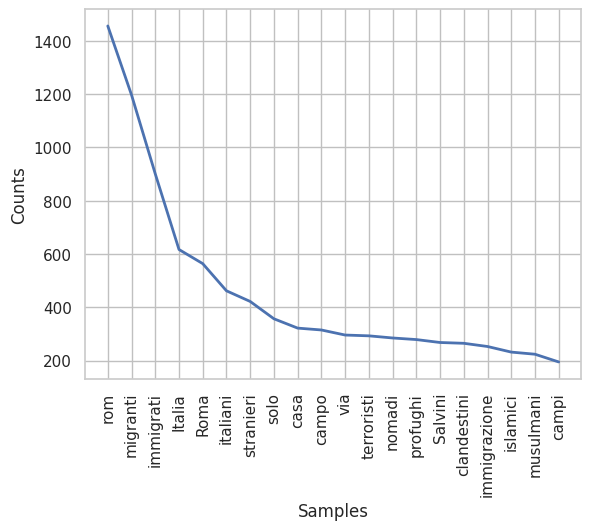

In [ ]:
#Unigrams.plot(20, cumulative=True)
Unigrams.plot(20, cumulative=False)

The graph above shows that there is an **Elbow Point** at the word "Italy", which means that the first three words characterise the corpus more than the others, making it clear which **Topics** are the most frequently addressed in the tweets.

<Axes: xlabel='Samples', ylabel='Counts'>

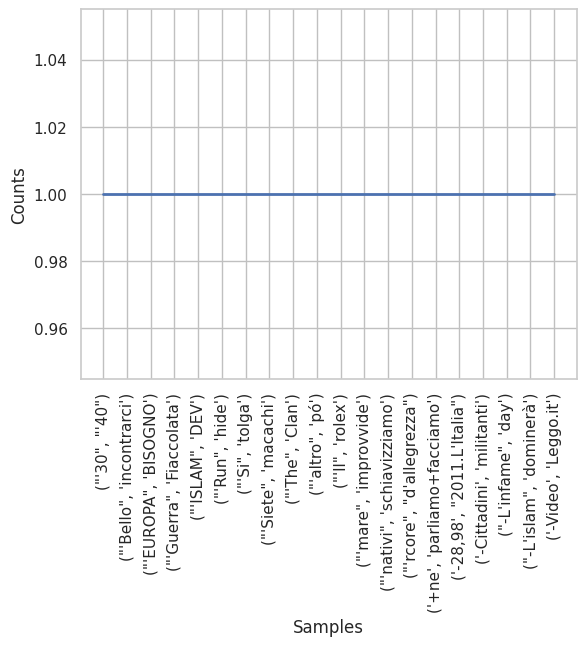

In [ ]:
bigrams = bigrams_finder.nbest(bigram_measures.pmi, 20)
bigrams_freq = FreqDist(bigrams)
#bigrams_freq.plot(20, cumulative=True)
bigrams_freq.plot(20, cumulative=False)

<Axes: xlabel='Samples', ylabel='Counts'>

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 127470 (\N{REGIONAL INDICATOR SYMBOL LETTER I}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 127481 (\N{REGIONAL INDICATOR SYMBOL LETTER T}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127470 (\N{REGIONAL INDICATOR SYMBOL LETTER I}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127481 (\N{REGIONAL INDICATOR SYMBOL LETTER T}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/co

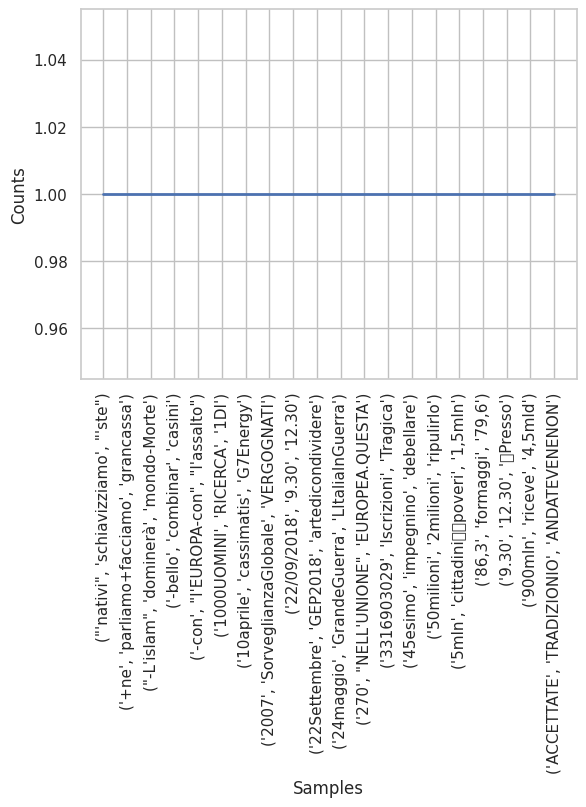

In [ ]:
trigrams = trigrams_finder.nbest(bigram_measures.pmi, 20)
trigrams_freq = FreqDist(trigrams)
#trigrams_freq.plot(20, cumulative=True)
trigrams_freq.plot(20, cumulative=False)

Both for Bigrams and Trigrams, each "*gram* " obtained has occurred just **one time** .

## Data Featuring

In this section i'm going to obtain the features from the Text contained in the dataframe to perform a **Classification Task**.

To get more info about the comparison of different **Text Vectorization Methods** click [here](https://scikit-learn.org/1.5/auto_examples/text/plot_hashing_vs_dict_vectorizer.html#sphx-glr-auto-examples-text-plot-hashing-vs-dict-vectorizer-py) .

Tehre is an euristic law to choose wether is better to use a BoW method or a Sequence Model(i.e RNN,Transformer) for a classification task:

*  $$\alpha = \frac{\text{Number of Sample}}{\text{Mean Sample Lenght}}\le  1500\implies \text{Bag-of-Word}$$

In [ ]:
Number_of_Sample = len(Text_Column)
Mean_Sample_Lenght = np.mean([len(tweet.split()) for tweet in Text_Column])
alpha = Number_of_Sample / Mean_Sample_Lenght

print(f'Number of Sample: {Number_of_Sample}')
print(f'Mean Sample Lenght: {Mean_Sample_Lenght.round()}')
print(f'Alpha: {alpha.round()}')

if alpha <= 1500:
  print('\nBag-of-Word Model is suggested.')
else:
  print('\nSequence Model is suggested.')

### Functions by Hand

* **BoW**

In [ ]:
def corpus_nltk_tokenizer(corpus, stopwords, punctuations):
  new_corpus = []
  for sentences in corpus:

    word_tokenized = word_tokenize(sentences)
    word_tokenized_filtered = [word for word in word_tokenized if word not in stopwords and word not in punctuations]
    new_corpus.append(word_tokenized_filtered)

  return new_corpus

def build_vocab(corpus_tokens):

  # usando un set evitiamo
  # l'inserimento di duplicati
  vocab = set({})

  for tokens in corpus_tokens:
    for token in tokens:
      vocab.add(token)

  return list(vocab)

def bag_of_words(corpus, stopwords, punctuations):

  corpus_tokens = corpus_nltk_tokenizer(corpus, stopwords, punctuations)
  vocab = build_vocab(corpus_tokens)

  corpus_bow = []

  for tokens in corpus_tokens:
    sent_bow = []

    for word in vocab:
      sent_bow.append(tokens.count(word))
    corpus_bow.append(sent_bow)

  return corpus_bow, vocab

* **TF - IDF**

In [ ]:
def tf_idf(corpus, stopwords, punctuations): #

  corpus_tokens = corpus_nltk_tokenizer(corpus, stopwords, punctuations)
  vocab = build_vocab(corpus_tokens)

  # Document Frequency

  df = [0]*len(vocab)

  for i,word in enumerate(vocab):
    for tokens in corpus_tokens:
      if(word in tokens):
        df[i]+=1

  # Inverse Document frequency

  docs_count = len(corpus)

  # Prevent the Zero Division
  # Equivalent of  " smooth_idf=True "
  idf = [log((1 + docs_count)/(i + 1 ))+1 for i in df]

  # Term Frequency

  tf = []

  for tokens in corpus_tokens:
    tf_sent = []
    words_count = len(tokens)

    for word in vocab:
      tf_sent.append(tokens.count(word)/words_count)
    tf.append(tf_sent)

  #TF-IDF

  tf_idf = []

  for i in range(docs_count):
    tf_idf.append([tf_i*idf_i for tf_i,idf_i in zip(tf[i],idf)])

  return tf_idf, vocab

* **Skip-Grams**

In [ ]:
# Generates skip-gram pairs with negative sampling for a list of sequences
# (int-encoded sentences) based on window size, number of negative samples
# and vocabulary size.
def generate_training_data(sequences, window_size, num_ns, vocab_size, seed):
  # Elements of each training example are appended to these lists.
  targets, contexts, labels = [], [], []

  # Build the sampling table for `vocab_size` tokens.
  sampling_table = tf.keras.preprocessing.sequence.make_sampling_table(vocab_size)

  # Iterate over all sequences (sentences) in the dataset.
  for sequence in tqdm.tqdm(sequences):

    # Generate positive skip-gram pairs for a sequence (sentence).
    positive_skip_grams, _ = tf.keras.preprocessing.sequence.skipgrams(
          sequence,
          vocabulary_size=vocab_size,
          sampling_table=sampling_table,
          window_size=window_size,
          negative_samples=0)

    # Iterate over each positive skip-gram pair to produce training examples
    # with a positive context word and negative samples.
    for target_word, context_word in positive_skip_grams:
      context_class = tf.expand_dims(
          tf.constant([context_word], dtype="int64"), 1)
      negative_sampling_candidates, _, _ = tf.random.log_uniform_candidate_sampler(
          true_classes=context_class,
          num_true=1,
          num_sampled=num_ns,
          unique=True,
          range_max=vocab_size,
          seed=seed,
          name="negative_sampling")

      # Build context and label vectors (for one target word)
      context = tf.concat([tf.squeeze(context_class,1), negative_sampling_candidates], 0)
      label = tf.constant([1] + [0]*num_ns, dtype="int64")

      # Append each element from the training example to global lists.
      targets.append(target_word)
      contexts.append(context)
      labels.append(label)

  return targets, contexts, labels

### Texts To Vectors

#### BoW

##### Pyhton

In [ ]:
corpus = Text_Column
type(corpus)

In [ ]:
punctuations_set = set(string.punctuation)
punctuations_set.update(["''",'..','...','....','................','”','``',"’",'“','»','«'])

ita_stopwords = stopwords.words('italian') + ['mai','no','poi','dopo','già','è']
ita_capitalized_stopwords = [word.capitalize() for word in ita_stopwords]
ita_upper_stopwords = [word.upper() for word in ita_stopwords]
ita_stopwords = ita_upper_stopwords + ita_capitalized_stopwords + ita_stopwords + ['NN','nn','prrrrrrrrrrrrrrr','user','URL','url','x','X','5','2']

In [ ]:
filtered_tok_corpus = corpus_nltk_tokenizer(corpus, ita_stopwords, punctuations_set)

* The variable below is the result of the *ad hoc* tokenization obtained before applied to each different tweet of the orginal dataset.

In [ ]:
filtered_tok_corpus[:3]

In [ ]:
corpus_bow, vocab = bag_of_words(corpus, ita_stopwords, punctuations_set)

In [ ]:
print("Vocabulary:",vocab)
print("\n")

for sent, bow in zip(corpus[:3], corpus_bow[:3]):
  print("Sentence:", sent)
  print("Bag of Words:", bow)
  print("-------")

In [ ]:
Py_BoW = np.array(corpus_bow)

##### Sci-Kit

In [ ]:
BoW = CountVectorizer(input = 'content', stop_words  = ita_stopwords , ngram_range = (1,1))

 * **fit_transform( raw_documents , y = None)** : earn the vocabulary dictionary and return document-term matrix.
  - **raw_documents** iterable : An iterable which generates
  either str, unicode or file objects.

The *filtered_corpus* must be modified.

In [ ]:
filtered_corpus = [' '.join(tokens) for tokens in filtered_tok_corpus]
assert len(filtered_corpus) == len(corpus) # 6873

In [ ]:
# For Example
print( f'Filterd Corpus : {filtered_corpus[0]}\n\nOriginal Corpus : {corpus[0]}')

In [ ]:
BoW_representation = BoW.fit_transform(filtered_corpus)
BoW_representation.toarray()

In [ ]:
Py_BoW

In [ ]:
Py_BoW.shape , BoW_representation.shape

 Since i did not provide any vocabulary to the **Count Vectorizer()**,a vocabulary is determined from the input documents considering only the **top max_features** ordered by term frequency across the corpus.

 This is the reason why the arrays have a different number of features and so column.

In [ ]:
BoW.fixed_vocabulary_

Let's see how the vocabulary has been built w.r.t the one built by using

In [ ]:
BoW_Vocabulary = BoW.vocabulary_

In [ ]:
BoW_Vocabulary

In [ ]:
len(BoW_Vocabulary) , (len(vocab)) # As seen before they are different.

In [ ]:
BoW_sorted_Voc = dict(sorted(BoW_Vocabulary.items(), key=lambda item: item[0], reverse=True))

In [ ]:
other_stopWords = ['іl',
                   'xd',
                  'xcui',
                  'xché',
                  'xchè',
                  'xche',
                  'xbenismo',
                  'xxviii',
                  'xxv',
                  'xxo',
                  'xxi',
                  'xx',
                  'xv',
                  'xpregare',
                  'xo',
                  'xme',
                  'xla',
                  'xké',
                  'xkè',
                  'xke',
                  'xk',
                  'xix',
                  'xi',
                  'xfavore']

In [ ]:
BoW_sorted_Voc # "سلام " is "Salaam" in Arabic --- åkesson is the leader of Swedish democracy

##### Comparison

 * In the following i'm going to repeat the analysis defining again the **stop_words**.

In [ ]:
punctuations_set = set(string.punctuation)
punctuations_set.update(["''",'..','...','....','................','”','``',"’",'“','»','«'])

ita_stopwords = stopwords.words('italian') + ['fare','anni','mai','no','poi','dopo','già','è']
ita_capitalized_stopwords = [word.capitalize() for word in ita_stopwords]
ita_upper_stopwords = [word.upper() for word in ita_stopwords]
ita_stopwords = ita_upper_stopwords + ita_capitalized_stopwords + ita_stopwords + ['NN','nn','prrrrrrrrrrrrrrr','user','URL','url','x','X','5','2']

In [ ]:
ita_stopwords = ita_stopwords + other_stopWords

* **nltk & Python**

In [ ]:
corpus_bow2, vocab2 = bag_of_words(corpus, ita_stopwords, punctuations_set)

In [ ]:
Py_BoW2 = np.array(corpus_bow2)

In [ ]:
filtered_tok_corpus2 = corpus_nltk_tokenizer(corpus, ita_stopwords, punctuations_set)

* **Sci-Kit**

In [ ]:
BoW2 = CountVectorizer(input = 'content', stop_words  = ita_stopwords , ngram_range = (1,1))

In [ ]:
filtered_corpus2 = [' '.join(tokens) for tokens in filtered_tok_corpus2]

In [ ]:
# For Example
print( f'Filterd Corpus : {filtered_corpus2[1]}\n\nOriginal Corpus : {corpus[1]}')

In [ ]:
BoW_representation2 = BoW2.fit_transform(filtered_corpus2)
BoW_representation2.toarray()

In [ ]:
BoW2.get_feature_names_out()

In [ ]:
BoW2_Vocabulary = BoW2.vocabulary_

In [ ]:
BoW2_sorted_Voc = dict(sorted(BoW2_Vocabulary.items(), key=lambda item: item[0], reverse=True))

In [ ]:
BoW2_disc_Voc = dict(sorted(BoW2_Vocabulary.items(), key=lambda item: item[0], reverse=False))

In [ ]:
len(BoW2_sorted_Voc), len(vocab2)

In [ ]:
Py_BoW2.shape , BoW_representation2.shape

#### TF - IDF

Tf means term-frequency while tf-idf means term-frequency times inverse document-frequency. This is a common term weighting scheme in information retrieval, that has also found good use in document classification.

* The goal of using tf-idf instead of the raw frequencies of occurrence of a token in a given document is to scale down the impact of tokens that occur very frequently in a given corpus and that are hence empirically less informative than features that occur in a small fraction of the training corpus.

For more info click [here](https://scikit-learn.org/1.5/modules/generated/sklearn.feature_extraction.text.TfidfTransformer.html#sklearn.feature_extraction.text.TfidfTransformer) .

##### Python

In [ ]:
corpus_tfidf, vocab_tfidf = tf_idf(corpus, ita_stopwords, punctuations_set)

In [ ]:
assert vocab_tfidf == vocab2

In [ ]:
print("Dizionario:",vocab_tfidf[:10])
print("\n")

for sent, tfidf in zip(corpus[:3], corpus_tfidf[3]):
  print("Frase:", sent)
  print("TF-IDF:", tfidf)
  print("-------")

##### Sci-Kit

In [ ]:
BoW_representation2 = BoW2.fit_transform(filtered_corpus2)

In [ ]:
tf_idf_transformer =  TfidfTransformer(norm = 'l2',       # Euclidean Space
                                       use_idf = True,    # inverse-document-frequency reweighting
                                       smooth_idf = True) # Prevents zero divisions

In [ ]:
tf_idf_representation = tf_idf_transformer.fit_transform(BoW_representation2)

* It is equivalent to do directly :

In [ ]:
TF_IDF = TfidfVectorizer(input = 'content',
                         stop_words  = ita_stopwords ,
                         ngram_range = (1,1),
                         norm = 'l2',
                         use_idf = True,
                         smooth_idf = True)

In [ ]:
TF_IDF_representation = TF_IDF.fit_transform(filtered_corpus2)

In [ ]:
TF_IDF_array = TF_IDF_representation.toarray() # 1 step
tf_idf_array = tf_idf_representation.toarray() # 2 steps

In [ ]:
assert tf_idf_representation.shape == TF_IDF_representation.shape # (6837, 18023)
assert np.array_equal(TF_IDF.get_feature_names_out(), BoW2.get_feature_names_out()) # Same features processed

In [ ]:
# BoW2.get_feature_names_out()

In [ ]:
# TF_IDF.get_feature_names_out()

#### Word2Vec

[**Word2vec**](https://www.tensorflow.org/text/tutorials/word2vec#skip-gram_and_negative_sampling)  is not a singular algorithm, rather, it is a family of model architectures and optimizations that can be used to learn word **Embeddings** from large datasets.

There are mainly two methods for learning representations of words:

* **Continuous bag-of-words** model: predicts the middle word based on surrounding context words. The context consists of a few words before and after the current (middle) word. This architecture is called a bag-of-words model as the **order** of words in the context is **not important** .


* **Continuous skip-gram** model: predicts words within a certain range before and after the current word in the same sentence.

In other terms, while a **CBOW** model predicts a word given the neighboring context, a **Skip-Gram** model predicts the context (or neighbors) of a word, given the word itself.

 In the following we will implement the **Skip-Gram** with **Negative Sampling**.

After the embedding, one should apply some **pooling** technique in order to use them for the classification task.

In particular one should find the proper way to map the embedded vector to the original sentences.

## Classification Models

In the following we are going to use two **Linear & Probabilistic Classifier** :
1. **Naive Bayes** which is a **Generative Model**;
2. **Logistic Regression** which is a **Discriminative Model**.



To better understand the differences in the following i'm going to provide the correct questions and relative correct answers.


* What does it means to be a **generative** or a **discriminative** model ?

In simple terms, cosnidering our case study, we can say that a generative model is capable of "understaning" how to express or not an Hate Speech writing a tweet, that's why he can **classify** it and also **generate** a new one of it.

On the other hand, a discriminative model, learn how to **separate** the classes $hs = 1,0$ without really "understanding" them. For example, in our case study, the model may be able to separate the classes by noticing either the presence of certain words to express hate or the usage of lower case letters to do not. Of course there is no way to generate something from the trained model.

* What gives rise to this difference?


This pivotal difference is related to how the two models calculate the *probability of belonging to a class given the document*, formally known as $P(c|d)$ .

In a Discriminative model one directly evaluate $P(c|d)$ by properly training the learnable parameters of the model (weights and biases) in order to minimize the *ad hoc* Loss Function.

In a Bayesian generative model the quantity $P(c|d)$ is the so called *Posterior Probability*. The Posterior  is evaluated by first computing the *prior* $P(c)$ and the **Likelihood Function** $→P(d|c)$ that is the reason why we call model like this Generative. In other words, if one can calculate the *probability of being a certain type of document given the membership class* it can also generate such document.

The mathematical details of each model are discussed in the relative section.

* Which model should i consider for a Classification Task?

Unfortunately or fortunately it depends on the goal that one want to achive, however we can try to give an answer both starting to better understand how models works in detail and comparing them at the end of the analysis using the correct **Evaluation Metrics** and **Statistical Tests**.

For more details check the Conclusions section.





Here the references for the documentation:

*   For the logistic regression refer to the Scikit-learn documentation at [link](https://scikit-learn.org/1.5/modules/generated/sklearn.linear_model.LogisticRegression.html)

*   For the Naive Bayes classifier refer to [Scikit-learn documentation](https://scikit-learn.org/1.5/modules/naive_bayes.html) or [NLTK documentation](https://www.nltk.org/book/ch06.html)

*    For the metrics refer also to [Scikit-learn documentation](https://scikit-learn.org/1.5/modules/model_evaluation.html) or [NLTK documentation](https://www.nltk.org/book/ch06.html)



#### Functions

In [ ]:
def corpus_nltk_tokenizer(corpus, stopwords, punctuations):
  new_corpus = []
  for sentences in corpus:

    word_tokenized = word_tokenize(sentences)
    word_tokenized_filtered = [word for word in word_tokenized if word not in stopwords and word not in punctuations]
    new_corpus.append(word_tokenized_filtered)

  return new_corpus

In [ ]:
def df_Splitting(X, y, val_size, test_size, random_state, show_sample = True):


  # Prima divisione: 80% train_val e 20% test
  X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size = test_size , random_state=42)

  # Seconda divisione: 75% train e 25% validation (su 80% totale originale)
  X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = val_size, random_state=42)

  # Mostra il numero di campioni per ciascun set
  if show_sample :
    print(f"Train set: {X_train.shape[0]} campioni")
    print(f"Validation set: {X_val.shape[0]} campioni")
    print(f"Test set: {X_test.shape[0]} campioni")

  # Resetto gli indici
  X_train = X_train.reset_index(drop=True)
  X_val = X_val.reset_index(drop=True)
  X_test = X_test.reset_index(drop=True)

  y_train = y_train.reset_index(drop=True)
  y_val = y_val.reset_index(drop=True)
  y_test = y_test.reset_index(drop=True)

  return X_train, X_val, X_test, y_train, y_val, y_test

In [ ]:
def plot_model_metrics(results_df, bar_width = 0.10):
    """
    Creates a bar plot displaying model performance metrics.

    Parameters:
    - results_df (pd.DataFrame): DataFrame containing columns 'Model', 'Score', 'Recall', 'Precision', 'F1'.
    """
    # Set up the figure and bar width
    fig, ax = plt.subplots(figsize=(10, 6))
    bar_width = bar_width

    # Define the bar positions for each metric
    r1 = np.arange(len(results_df))
    r2 = [x + bar_width for x in r1]
    r3 = [x + bar_width for x in r2]
    r4 = [x + bar_width for x in r3]

    # Plot bars for each metric
    ax.bar(r1, results_df['Score'], color='blue', width=bar_width, edgecolor='grey', label='Score')
    ax.bar(r2, results_df['Recall'], color='red', width=bar_width, edgecolor='grey', label='Recall')
    ax.bar(r3, results_df['Precision'], color='green', width=bar_width, edgecolor='grey', label='Precision')
    ax.bar(r4, results_df['F1'], color='orange', width=bar_width, edgecolor='grey', label='F1')

    # Set x-axis labels (Model names)
    plt.xticks([r + bar_width*1.5 for r in range(len(results_df))], results_df['Model'])

    # Add title, legend, and axis labels
    plt.legend()
    plt.title('Model Performance Metrics')
    plt.xlabel('Model')
    plt.ylabel('Metric Value')

    # Adjust layout to avoid overlaps
    plt.tight_layout()

    # Display the plot
    plt.show()

In [ ]:
# Generates skip-gram pairs with negative sampling for a list of sequences
# (int-encoded sentences) based on window size, number of negative samples
# and vocabulary size.
def generate_training_data(sequences, window_size, num_ns, vocab_size, seed):
  # Elements of each training example are appended to these lists.
  targets, contexts, labels = [], [], []

  # Build the sampling table for `vocab_size` tokens.
  sampling_table = tf.keras.preprocessing.sequence.make_sampling_table(vocab_size)

  # Iterate over all sequences (sentences) in the dataset.
  for sequence in tqdm.tqdm(sequences):

    # Generate positive skip-gram pairs for a sequence (sentence).
    positive_skip_grams, _ = tf.keras.preprocessing.sequence.skipgrams(sequence,
                                                                      vocabulary_size=vocab_size,
                                                                      sampling_table=sampling_table,
                                                                      window_size=window_size,
                                                                      negative_samples=0)

    # Iterate over each positive skip-gram pair to produce training examples
    # with a positive context word and negative samples.
    for target_word, context_word in positive_skip_grams:
      context_class = tf.expand_dims(tf.constant([context_word], dtype="int64"), 1)
      negative_sampling_candidates, _, _ = tf.random.log_uniform_candidate_sampler(true_classes=context_class,
                                                                                  num_true=1,
                                                                                  num_sampled=num_ns,
                                                                                  unique=True,
                                                                                  range_max=vocab_size,
                                                                                  seed=seed,
                                                                                  name="negative_sampling")

      # Build context and label vectors (for one target word)
      context = tf.concat([tf.squeeze(context_class,1), negative_sampling_candidates], 0)
      label = tf.constant([1] + [0]*num_ns, dtype="int64")

      # Append each element from the training example to global lists.
      targets.append(target_word)
      contexts.append(context)
      labels.append(label)

  return targets, contexts, labels

In [ ]:
def Word2Vec_Visualization(weights_w2v, vocab_w2v, download = False):

  import io
  out_v = io.open('vectors.tsv', 'w', encoding='utf-8')
  out_m = io.open('metadata.tsv', 'w', encoding='utf-8')

  for index, word in enumerate(vocab_w2v):
    if index == 0:
      continue  # skip 0, it's padding.
    vec = weights_w2v[index]
    out_v.write('\t'.join([str(x) for x in vec]) + "\n")
    out_m.write(word + "\n")
  out_v.close()
  out_m.close()

  if download:
    try:
      from google.colab import files
      files.download('vectors.tsv')
      files.download('metadata.tsv')
    except Exception:
      pass

#### Corpus

In [ ]:
corpus = Text_Column
type(corpus)

list

In [ ]:
other_stopWords = ['іl',
                   'xd',
                  'xcui',
                  'xché',
                  'xchè',
                  'xche',
                  'xbenismo',
                  'xxviii',
                  'xxv',
                  'xxo',
                  'xxi',
                  'xx',
                  'xv',
                  'xpregare',
                  'xo',
                  'xme',
                  'xla',
                  'xké',
                  'xkè',
                  'xke',
                  'xk',
                  'xix',
                  'xi',
                  'xfavore'] + ['NN','nn','prrrrrrrrrrrrrrr','user','URL','url','x','X','5','2']

In [ ]:
punctuations_set = set(string.punctuation)
punctuations_set.update(["''",'..','...','....','................','”','``',"’",'“','»','«'])

ita_stopwords = stopwords.words('italian') + ['fare','anni','mai','no','poi','dopo','già','è'] + other_stopWords
ita_capitalized_stopwords = [word.capitalize() for word in ita_stopwords]
ita_upper_stopwords = [word.upper() for word in ita_stopwords]

ita_stopwords = ita_upper_stopwords + ita_capitalized_stopwords + ita_stopwords

In [ ]:
filtered_tok_corpus2 = corpus_nltk_tokenizer(corpus, ita_stopwords, punctuations_set)

In [ ]:
filtered_corpus2 = [' '.join(tokens) for tokens in filtered_tok_corpus2]

In [ ]:
# For Example
print( f'Filterd Corpus : {filtered_corpus2[1]}\n\nOriginal Corpus : {corpus[1]}')

Filterd Corpus : infatti finché guadagnato campi rom ok Alemanno Ipocriti

Original Corpus : @user @user infatti finché ci hanno guadagnato con i campi #rom tutto era ok con #Alemanno #Ipocriti 


###### TF - IDF Feauturing

In [ ]:
TF_IDF = TfidfVectorizer(input = 'content',
                         stop_words  = ita_stopwords ,
                         ngram_range = (1,1),
                         norm = 'l2',
                         use_idf = True,
                         smooth_idf = True)

In [ ]:
TF_IDF_representation = TF_IDF.fit_transform(filtered_corpus2)

In [ ]:
TF_IDF_array = TF_IDF_representation.toarray()

In [ ]:
TF_IDF_array.shape

(6837, 18021)

In [ ]:
# Feature Name TF-IDF (unique words)
feature_names_IDF = TF_IDF.get_feature_names_out()

#  TF-IDF to DataFrame
tfidf_df = pd.DataFrame(TF_IDF_representation.toarray(), columns = feature_names_IDF)

#  TF-IDF + known label + target
tfidf_df['stereotype'] = text_df['stereotype']
tfidf_df['Target_hs'] = text_df['hs']

In [ ]:
tfidf_df

,00,000,002,007,03,04,05,06,08,085,...,zuccaro,zucchero,zucconi,zuckerberg,zurigo,åkesson,élite,سلام,stereotype,Target_hs
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6832,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
6833,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
6834,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
6835,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0


 ##### Word2Vec Feauturing

###### Skip-Grams generation

In [ ]:
Full_filtered_corpus2Text = ' '.join(filtered_corpus2)

In [ ]:
corpus_tokens = list(Full_filtered_corpus2Text.split())

In [ ]:
len(corpus_tokens)

88972

In [ ]:
SEED = 42
AUTOTUNE = tf.data.AUTOTUNE

In [ ]:
vocab_size = len(corpus_tokens)
sequence_length = 23 # 23 is the mean lenght of the tweets

In [ ]:
text_ds = tf.data.Dataset.from_tensor_slices(filtered_corpus2)

In [ ]:
vectorize_layer = layers.TextVectorization(
    standardize = 'lower',
    max_tokens = vocab_size,
    split = 'whitespace',
    output_mode = 'int',
    output_sequence_length = sequence_length)

In [ ]:
text_ds = tf.data.Dataset.from_tensor_slices(filtered_corpus2)

In [ ]:
vectorize_layer.adapt(text_ds.batch(1024))

In [ ]:
# Save the created vocabulary for reference.
inverse_vocab = vectorize_layer.get_vocabulary()
print(inverse_vocab[:20])

['', '[UNK]', 'rom', 'migranti', 'immigrati', 'italia', 'roma', 'italiani', 'stranieri', 'solo', 'casa', 'via', 'campo', 'clandestini', 'salvini', 'terroristi', 'profughi', 'nomadi', 'immigrazione', 'islamici']


In [ ]:
text_mapped = text_ds.map(vectorize_layer)

In [ ]:
sequences = list(text_mapped.as_numpy_iterator())
for seq in sequences[:3]:
  print(f"{seq} => {[inverse_vocab[i] for i in seq]}")

[   39   354    46  9810    85 11127 14458   175   151     0     0     0
     0     0     0     0     0     0     0     0     0     0     0] => ['terrorismo', 'mettere', 'stato', 'soggezione', 'persone', 'renderle', 'innocue', 'mentre', 'qualcuno', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
[ 540 1356 2903   25    2  578 5169  953    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0] => ['infatti', 'finché', 'guadagnato', 'campi', 'rom', 'ok', 'alemanno', 'ipocriti', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '']
[ 383 1068  205  334 7195 5038   25    2    6    0    0    0    0    0
    0    0    0    0    0    0    0    0    0] => ['corriere', 'tangenti', 'mafia', 'capitale', 'dimenticatamazzette', 'buche', 'campi', 'rom', 'roma', '', '', '', '', '', '', '', '', '', '', '', '', '', '']


In [ ]:
filtered_corpus2[:5]

['terrorismo mettere stato soggezione persone renderle innocue mentre qualcuno',
 'infatti finché guadagnato campi rom ok Alemanno Ipocriti',
 'Corriere Tangenti Mafia Capitale dimenticataMazzette buche campi rom roma',
 'quando migranti israeliti arrivarono terra Canaan fuori Canaaniti',
 'divertimento giorno Trovare patrioti italiani inneggiano rom spesa Lidl multinazionale tedesca']

In [ ]:
inverse_vocab[2] # For Example

'rom'

Basically this is how we **encoded** our sentences.

In [ ]:
targets, contexts, labels = generate_training_data(sequences = sequences,
                                                    window_size = 4,
                                                    num_ns = 3,
                                                    vocab_size = vocab_size,
                                                    seed = SEED)

targets = np.array(targets)
contexts = np.array(contexts)
labels = np.array(labels)

print('\n')
print(f"targets.shape: {targets.shape}")
print(f"contexts.shape: {contexts.shape}")
print(f"labels.shape: {labels.shape}")

100%|██████████| 6837/6837 [01:05<00:00, 104.25it/s]




targets.shape: (200654,)
contexts.shape: (200654, 4)
labels.shape: (200654, 4)


After generating our Target and Context matrices, we must transform them in a tensorflow dataset.

In [ ]:
BATCH_SIZE = 1024
BUFFER_SIZE = 10000
dataset = tf.data.Dataset.from_tensor_slices(((targets, contexts), labels))
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE, drop_remainder=True)

In [ ]:
SGNS_dataset = dataset.cache().prefetch(buffer_size=AUTOTUNE)
print(SGNS_dataset)

<_PrefetchDataset element_spec=((TensorSpec(shape=(1024,), dtype=tf.int64, name=None), TensorSpec(shape=(1024, 4), dtype=tf.int64, name=None)), TensorSpec(shape=(1024, 4), dtype=tf.int64, name=None))>


This will be the Training dataset for the next section.

###### Embedding Training

In [ ]:
class Word2Vec(tf.keras.Model):
  def __init__(self, vocab_size, embedding_dim):
    super(Word2Vec, self).__init__()

    self.target_embedding = layers.Embedding(vocab_size,
                                            embedding_dim,
                                            name = "w2v_embedding")
    self.context_embedding = layers.Embedding(vocab_size,
                                              embedding_dim)

  def call(self, pair):
    target, context = pair
    # target: (batch, dummy?)
    # context: (batch, context)
    if len(target.shape) == 2:
      target = tf.squeeze(target, axis=1)
    # target: (batch,)
    word_emb = self.target_embedding(target)
    # word_emb: (batch, embed)
    context_emb = self.context_embedding(context)
    # context_emb: (batch, context, embed)
    dots = tf.einsum('be,bce->bc', word_emb, context_emb)
    # dots: (batch, context)
    return dots

In [ ]:
def Pooling(sequences, token_to_index,inverse_vocab, method = 'avg'):
  sentences_embedded_dataset = []

  for seq in sequences:
      sentence_row = []
      for token in seq:


        original_word = inverse_vocab[token]
        index_token_corpus = token_to_index.get(original_word)

        if index_token_corpus is not None:
            # Recupera l'embedding del token
            embedded_vector = weights_w2v[index_token_corpus]
        else:
            # Se il token non è nel vocabolario, uso un vettore nullo *
            embedded_vector = np.zeros(weights_w2v.shape[1])


        sentence_row.append(embedded_vector)

      # Pooling
      if method == 'avg':
        Pool_embedded_sentences = np.mean(sentence_row, axis=0)
      elif method == 'max':
        Pool_embedded_sentences = np.max(sentence_row, axis=0)
      elif method == 'sum':
        Pool_embedded_sentences = np.sum(sentence_row, axis=0)

      sentences_embedded_dataset.append(Pool_embedded_sentences)

  return sentences_embedded_dataset

In [ ]:
%load_ext tensorboard

In [ ]:
embedding_dim = 128
word2vec = Word2Vec(vocab_size, embedding_dim)
word2vec.compile(optimizer='adam',
                 loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True),
                 metrics = ['accuracy','Precision', 'Recall','AUC'])

In [ ]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="logs")

In [ ]:
word2vec.fit(SGNS_dataset,
             epochs = 15,
             callbacks=[tensorboard_callback])

Epoch 1/15
195/195 ━━━━━━━━━━━━━━━━━━━━ 81s 381ms/step - AUC: 0.5079 - Precision: 0.0000e+00 - Recall: 0.0000e+00 - accuracy: 0.2616 - loss: 1.3858
Epoch 2/15
195/195 ━━━━━━━━━━━━━━━━━━━━ 68s 350ms/step - AUC: 0.8517 - Precision: 0.1318 - Recall: 7.8996e-06 - accuracy: 0.7778 - loss: 1.3442
Epoch 3/15
195/195 ━━━━━━━━━━━━━━━━━━━━ 94s 411ms/step - AUC: 0.8557 - Precision: 0.5962 - Recall: 0.0020 - accuracy: 0.7590 - loss: 1.2236
Epoch 4/15
195/195 ━━━━━━━━━━━━━━━━━━━━ 72s 363ms/step - AUC: 0.8855 - Precision: 0.8488 - Recall: 0.0628 - accuracy: 0.8096 - loss: 1.0644
Epoch 5/15
195/195 ━━━━━━━━━━━━━━━━━━━━ 85s 379ms/step - AUC: 0.9349 - Precision: 0.9036 - Recall: 0.3377 - accuracy: 0.8910 - loss: 0.8629
Epoch 6/15
195/195 ━━━━━━━━━━━━━━━━━━━━ 72s 368ms/step - AUC: 0.9613 - Precision: 0.9214 - Recall: 0.6985 - accuracy: 0.9349 - loss: 0.6651
Epoch 7/15
195/195 ━━━━━━━━━━━━━━━━━━━━ 71s 363ms/step - AUC: 0.9738 - Precision: 0.9195 - Recall: 0.8793 - accuracy: 0.9576 - loss: 0.4991
Epoch 8/

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
weights_w2v = word2vec.get_layer('w2v_embedding').get_weights()[0]
vocab_w2v = vectorize_layer.get_vocabulary()
weights_w2v.shape, len(vocab_w2v)

((88972, 128), 20098)

In [ ]:
Word2Vec_Visualization(weights_w2v, vocab_w2v, download = False)

In [ ]:
assert len(vocab_w2v) == len(inverse_vocab)

In [ ]:
len(vocab_w2v)

20098

TensorFlow provides an **Embedding Projector** at the following [link](https://projector.tensorflow.org). If you download your Embedding results with the function above, you can upload them on the projector to visualize the distribution of your embedded words.

#### Naive Bayes

Before proceding further in the details of the implementation, the mathematical foundations of the model are as follows.

As said before, it is a **Probabilistic Model**, in fact it returns the class *$ĉ$*  with the **Maxiumum Posterior Probability** given a document *d* :
1. $$ĉ= \operatorname*{arg\,max}_{c \in C} P(c|d)$$

In our case study $C = [0, 1]$ while $d\in D = \{d_1,...d_i,..,d_N\}$.

 This a **Binary Classification Problem** where each Tweet in the dataset is considered a different document.

In order to solve the equation number one we need of 3 main ingredients:
* **Bayes Theorem** to state that :
  2.  $$ĉ= \operatorname*{arg\,max}_{c \in C} P(c|d) =  \operatorname*{arg\,max}_{c \in C}\frac{P(d|c)⋅ P(c)}{P(d)}=  \operatorname*{arg\,max}_{c \in C} P(d|c)⋅ P(c)$$

  


   Removing the normalization factor $P(d)$ does not change the results,besides in our case it is always the same both because we have just one collection of documents and there are no duplicates, in other terms :$$\forall i = 1,..,N:P(d_i) = \frac{1}{N} $$
* **Naive Bayes Assumption** to assume that given a class of documents the conditional probabilities of said documents are **indipendent**; each document is properly featured such that $∀d_i → F_i = \{f_1,..,f_K\}$ ,  :
  
  3.$$ P(f_1,..,f_K|c) = \prod_{j=1}^{K}P(f_j|c)$$

* **Bag of Word assumption** because we do not care about the position of the words in the corpus.


In the end we have that:
  4. $$c_{NB} = \operatorname*{arg\,max}_{c \in C} P(c)⋅\prod_{j=1}^{K}P(f_j|c)$$


##### Data Splitting

In [ ]:
X = tfidf_df.drop(['Target_hs'], axis = 1)
y = tfidf_df['Target_hs']

In [ ]:
X_train, X_val, X_test, y_train, y_val, y_test = df_Splitting(X, y,
                                                              val_size = 0.25,
                                                              test_size = 0.3,
                                                              random_state = 42)

Train set: 3588 campioni
Validation set: 1197 campioni
Test set: 2052 campioni


* In the Naive Bayes approach the validation dataset is not usefull.

In [ ]:
X_train_NB = pd.concat([X_train, X_val], axis=0).reset_index(drop=True)

y_train_NB = pd.concat([y_train, y_val], axis=0).reset_index(drop=True)

* In the following a little check of the target variables proportion for each splitted dataset. Each split has the same distribution of the original dataset as desired.

In [ ]:
hs_distributions

,proportion
hs,
0,59.54
1,40.46


In [ ]:
(y_train.value_counts(normalize=True) * 100).round(2)

,proportion
Target_hs,
0,58.78
1,41.22


In [ ]:
(y_val.value_counts(normalize=True) * 100).round(2)

,proportion
Target_hs,
0,59.82
1,40.18


In [ ]:
(y_test.value_counts(normalize=True) * 100).round(2)

,proportion
Target_hs,
0,60.72
1,39.28


##### Multinomial NB

* Target Variable has the same distribution of the original dataset.

In [ ]:
(y_train_NB.value_counts(normalize=True) * 100).round(2)

,proportion
Target_hs,
0,59.04
1,40.96


In [ ]:
MNB_model = MultinomialNB(fit_prior = True)
MNB_fitted_model = MNB_model.fit(X_train_NB, y_train_NB)

In [ ]:
MNB_predicted_labels = MNB_fitted_model.predict(X_test)

In [ ]:
MNB_mean_accuracy = MNB_model.score(X_test, y_test)
MNB_recall = recall_score(y_test, MNB_predicted_labels)
MNB_precision = precision_score(y_test, MNB_predicted_labels)
MNB_f1 = f1_score(y_test, MNB_predicted_labels)

* Mean accuracy of predicted lables w.r.t. target variable.

In [ ]:
print(f'Mean Accuracy: {MNB_mean_accuracy*100:.2f} %')
print(f'Recall: {MNB_recall*100:.2f} %')
print(f'Precision: {MNB_precision*100:.2f} %')
print(f'F1: {MNB_f1*100:.2f} %')

Mean Accuracy: 79.19 %
Recall: 78.29 %
Precision: 71.46 %
F1: 74.72 %


In [ ]:
MNB__results = {
    'Model': 'Multinomial Naive Bayes',
    'Score': MNB_mean_accuracy,
    'Recall': MNB_recall,
    'Precision': MNB_precision,
    'F1': MNB_f1
}

In [ ]:
confusion_matrix(y_test, MNB_predicted_labels, normalize = 'true')

array([[0.79775281, 0.20224719],
       [0.21712159, 0.78287841]])

##### Complement NB

In [ ]:
ComplementNB_model = ComplementNB(fit_prior = True)
ComplementNB_fitted_model = ComplementNB_model.fit(X_train_NB, y_train_NB)

In [ ]:
ComplementNB_predicted_labels = ComplementNB_fitted_model.predict(X_test)

In [ ]:
ComplementNB_mean_accuracy = ComplementNB_model.score(X_test, y_test)
ComplementNB_Recall = recall_score(y_test, ComplementNB_predicted_labels)
ComplementNB_Precision = precision_score(y_test, ComplementNB_predicted_labels)
ComplementNB_F1 = f1_score(y_test, ComplementNB_predicted_labels)

In [ ]:
print(f'Mean Accuracy: {ComplementNB_mean_accuracy*100:.2f} %')
print(f'Recall: {ComplementNB_Recall*100:.2f} %')
print(f'Precision: {ComplementNB_Precision*100:.2f} %')
print(f'F1: {ComplementNB_F1*100:.2f} %')

Mean Accuracy: 74.76 %
Recall: 88.34 %
Precision: 62.68 %
F1: 73.33 %


In [ ]:
ComplementNB_results = {
    'Model': 'Complement Naive Bayes',
    'Score': ComplementNB_mean_accuracy,
    'Recall': ComplementNB_Recall,
    'Precision': ComplementNB_Precision,
    'F1': ComplementNB_F1
}

In [ ]:
confusion_matrix(y_test, ComplementNB_predicted_labels, normalize = 'true')

array([[0.65971108, 0.34028892],
       [0.11662531, 0.88337469]])

#### Logistic Regression

Have you ever wondered why, even in the case of NNs, the logistic function is used to evaluate the probability that a certain vector $x$ belongs to a certain class $c$ ?


Usually the answer is : "We need a function (called an activation function for NNs) that maps any input number between zero and one, this allows us to interpret them as probabilities".

The point is that if this were the case we could choose from a potentially infinite number of functions, provided they are differentiable of course. So it is easy to imagine that this answer (if it can be so defined) and similar ones are meaningless. The question arises:

* **Then why do we use the Logistic Function?**

To get the answer we must reason in **Bayesian terms** .


Lets'consider the case of a **Binary Classification** task like this. We can express the posterior probability using Bayes' Theorem:

1. $$P(c_1|f_1,...,f_K) = \frac{P(f_1,...,f_K|c_1)\cdot P(c_1)}{∑_{s=1,2} P(f_1,...,f_K|c_s)\cdot P(c_s)} ≡ \frac{1}{1+\exp(-a)}=σ (a)$$

these mathematical steps are only valid if :

2. $$a = \ln{\frac{P(f_1,...,f_K|c_1)\cdot P(c_1)}{P(f_1,...,f_K|c_2)\cdot P(c_2)}}$$


This is the reason why we do not "choose at will" the **Logistic Function** $σ(a)$, it emerges naturally from simple mathematical steps. The function $a$ is also known as the **Logit Function**, which is the **Inverse** of the Sigmoid :

- $$a = \text{logit}(p) = \ln \left( \frac{p}{1 - p} \right)=\sigma^{-1}(p)$$

In general $p=p(y_{target}=1)$, so in this case $p=\sigma(a$).

* **Then, how does this relate to Logistic Regression?**

The logit function takes different forms depending on the **Assumptions** we make about **class-conditional densities** :

*  $$P(f_1,...,f_K|c_s) ∀s$$


Noting this, the **Core Question** arises:

* **What assumptions do we make about class-conditional densities to fall in the Lostic Regression case?**

Before answering the question,since we only have two possible classes, it is easy to convince oneself that :

3. $$P(c_2|f_1,...,f_K)=1-P(c_1|f_1,...,f_K)≡1-\frac{1}{1+\exp(-a)}= \frac{\exp(-a)}{1+\exp(-a)}=\frac{1}{1-\exp(a)}=σ(-a)$$

  - We showed that the sigmoid satisfies the **Simmetry Property** :
  
  $$1-σ(a) = σ(-a)$$

From now on, is better to simplify the notation considering $x = (f_1,...,f_K)$.

In general, if we assume that the **Class-Conditional Densities** $∈$ **Exponential Family of Distribution**$\implies a=a(x)$ is a **Generalized Linear Model** (a.k.a **GLM**). In the following i will mention two of the most famous [Exponential Distribution](https://en.wikipedia.org/wiki/Exponential_family), **Gaussian Distribution** for continuous variables and **Bernulli Distribution** for the discrete ones.

So, to answer the previous question, we can fall into the particular case of Logistic Regression in two different ways, depending on whether the **Features** are **Continuous** or **Discrete**, more specifically we know that :

*  **LR** for Continuous Features $\Leftrightarrow$ **Gaussian Class-Conditional Densities** and **equal** $\Sigma$ ;

*  **LR** for Discrete Features $\Leftrightarrow$ **Bernoulli Class-Conditional Densities** .

In our case, since the features obtained with the tf-idf method are continuous, we are implicitly assuming that we are considering **Gaussian Class-Conditional Densities** with the **same Covariance Matrix $Σ$** . The latter condition **guarantees** the **Linearity** of the model.
Formally, considering  $p(c_1) = \pi$ , we have:

4. $$P(x|c_1) = p(c_1)\cdot P(c_1|x) = \pi \cdot \mathcal{N(x|\mu_1,Σ)} $$

5. $$P(x|c_2) = p(c_2)\cdot P(c_2|x) = (1-\pi) \cdot \mathcal{N(x|\mu_2,Σ)} $$

Where $ \mu_1, \mu_2$ are the mean of all the input vectors $x$ which belongs respectively to $c_1,c_2$ classes.

In conclusion,it can be demonstrated that, in this case, the **GLM** is just a **Linear Model**, in particular:

6. $$a(x) = \mathbf{w}^T\mathbf{x} + w_0 \implies P(c_1|x) = \sigma(\mathbf{w}^T\mathbf{x} + w_0) $$

Where the **Weights Matrix** and the so called **Bias** are :
 - $$\mathbf{w} = \Sigma^{-1}(\mu_1 -\mu_2)$$

 - $$w_0 = \ln{\frac{\pi}{1-\pi}}$$

It is important to underline that the *prior distributions* of the classes come into play only if we consider the **Bias** term. Remeber that without the constraint related to **equal** $Σ$, the last formula should also have considered other terms that would have made $w_0$, and thus $a(x)$, a **quadratic function** of $x$  . I hope that now is more clear why the constriant is foundamental.

* **Nice speech, but isn't logistic regression a discriminative model?**

Yes, but its discriminative "nature" is linked to the different way in which we calculate the *posterior probability*. It is this **Maxiumum Likelihood (ML)** approach that makes the model "discriminative".

 First of all, one have to evaluate the **likelihood function** starting from the last result obtained before, i.e. that :

* $$P(c_1|x) = \sigma( \mathbf{w}^T\mathbf{x} + w_0)$$

From the **ML** p.o.v , such *Posterior Probability* rappresents our **Estimator** :

 7. $$\hat{y}(\mathbf{x}) = \sigma( \mathbf{w}^T\mathbf{x} + w_0)$$



 Our goal is to obtain the optimal set of weights such that the **difference** between the **Estimator** and the **Truth Ground** is minimized.

It can be demonstrated that if we assume that the target variable follow a *Bernoulli distribution* for binary problems, **maximising** the **Likelihood** is equivalent to **minimising** the **Cross-Entropy Loss** .
This is a very common *scenario* in classification problems, for example in our case **hs** is our target variable.


* **Why would anyone use this approach instead of the Bayesian one?**

There are at least **two** good reasons, the first is related to the fact that there is **no constraint** on class-conditional densities, the second is related to the number of **learnable parameters** to train.

For an **M dimensional** features space with the Bayesian approach, since one has to calculate both the averages and the covariance matrix, the parameters scale quadratically ( $\propto M^2)$. In contrast, with the maximum likelihood approach they scale linearly.

This is precisely why logistic regression is more suitable for large datasets.

* **

##### Data Splitting

Also in this case we just split the dataset in Train & Test.

In [ ]:
X_train_LR = X_train_NB
y_train_LR = y_train_NB

* Instead for word2vec training dataset we have :

In [ ]:
word2vec_dataset = pd.DataFrame(sequences)

In [ ]:
word2vec_dataset['stereotype'] = text_df['stereotype']
word2vec_dataset['hs'] = text_df['hs']

In [ ]:
word2vec_dataset

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,stereotype,hs
0,39,354,46,9810,85,11127,14458,175,151,0,...,0,0,0,0,0,0,0,0,0,0
1,540,1356,2903,25,2,578,5169,953,0,0,...,0,0,0,0,0,0,0,0,0,0
2,383,1068,205,334,7195,5038,25,2,6,0,...,0,0,0,0,0,0,0,0,0,0
3,28,3,14191,7738,305,18072,62,18071,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4810,81,799,3368,7,6739,2,1963,255,12928,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6832,186,3418,56,34,533,5912,638,1416,166,539,...,2213,114,28,476,3307,10907,18,472,0,0
6833,124,1874,256,14974,1006,138,49,4,42,1277,...,184,15281,448,61,17073,374,289,1133,0,0
6834,14,5,710,12995,278,4202,545,320,2258,11311,...,5031,837,14277,11977,0,0,0,0,0,0
6835,15196,748,1037,163,97,428,514,748,1037,3,...,677,4646,0,0,0,0,0,0,0,0


The next step consist of processing the sequences data in according to the results obtained with the word2vec model.

In [ ]:
token_to_index = {token: idx for idx, token in enumerate(corpus_tokens)}

In conclusion we must apply some **Pooling** technique in order to express each single sentence with the most rappresentative **Scalar**, of course it is impossible to determine the best pooling technique *a priori* .

It is also important to notice that in the `Pooling` function, the **OOV** cases are handled by inseritng a null vector as embedded result. Also in this case other options can be tried.





In [ ]:
sentences_embedded_dataset = Pooling(sequences, token_to_index, inverse_vocab, method = 'max')

In [ ]:
len(inverse_vocab)

20098

In [ ]:
W2V_Max_Pooling_df = pd.DataFrame(sentences_embedded_dataset)

In [ ]:
W2V_Max_Pooling_df.shape

(6837, 128)

In [ ]:
W2V_Max_Pooling_df['stereotype'] = text_df['stereotype']
W2V_Max_Pooling_df['hs'] = text_df['hs']

In [ ]:
W2V_Max_Pooling_df.columns = W2V_Max_Pooling_df.columns.astype(str)

In [ ]:
W2V_Max_Pooling_df.shape

(6837, 130)

In [ ]:
W2V_Max_Pooling_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6837 entries, 0 to 6836
Columns: 130 entries, 0 to hs
dtypes: float64(128), int64(2)
memory usage: 6.8 MB


In [ ]:
#W2V_Sum_Pooling_df

In [ ]:
Xw2v = W2V_Max_Pooling_df.drop(['hs'], axis = 1)
yw2v = W2V_Max_Pooling_df['hs']

In [ ]:
Xw2v_train, Xw2v_val, Xw2v_test, yw2v_train, yw2v_val, yw2v_test = df_Splitting(Xw2v, yw2v,
                                                              val_size = 0.25,
                                                              test_size = 0.3,
                                                              random_state = 42)

Train set: 3588 campioni
Validation set: 1197 campioni
Test set: 2052 campioni


In [ ]:
Xw2v_trainLR = pd.concat([Xw2v_train, Xw2v_val], axis=0).reset_index(drop=True)

yw2v_trainLR = pd.concat([yw2v_train, yw2v_val], axis=0).reset_index(drop=True)

##### LR Model

In [ ]:
LogisticR_model = LogisticRegression(penalty = 'l2',        # Ridge Regression
                                     random_state = 42,
                                     solver = 'lbfgs',
                                     max_iter = 1000,
                                     fit_intercept = False) # No Bias considered

In [ ]:
LogisticR_fitted_model = LogisticR_model.fit(X_train_LR, y_train_LR)

In [ ]:
# Extract the feature weights (coefficients) and feature names
feature_weights = LogisticR_fitted_model.coef_.reshape(-1)
feature_names = LogisticR_fitted_model.feature_names_in_

In [ ]:
LogisticR_predicted_labels = LogisticR_fitted_model.predict(X_test)

In [ ]:
LogisticR_mean_accuracy = LogisticR_model.score(X_test, y_test)
LogisticR_recall = recall_score(y_test, LogisticR_predicted_labels)
LogisticR_precision = precision_score(y_test, LogisticR_predicted_labels)
LogisticR_f1 = f1_score(y_test, LogisticR_predicted_labels)

In [ ]:
print(f'Mean Accuracy: {LogisticR_mean_accuracy*100:.2f} %')
print(f'Recall: {LogisticR_recall*100:.2f} %')
print(f'Precision: {LogisticR_precision*100:.2f} %')
print(f'F1: {LogisticR_f1*100:.2f} %')

Mean Accuracy: 79.19 %
Recall: 79.53 %
Precision: 70.99 %
F1: 75.01 %


In [ ]:
Logistic_results = {
    'Model': 'Logistic Regression',
    'Score': LogisticR_mean_accuracy,
    'Recall': LogisticR_recall,
    'Precision': LogisticR_precision,
    'F1': LogisticR_f1
}

In [ ]:
confusion_matrix(y_test, LogisticR_predicted_labels, normalize = 'true')

array([[0.78972713, 0.21027287],
       [0.20471464, 0.79528536]])

* **Word2Vec** dataset training :

In [ ]:
LogisticR_model_w2v = LogisticRegression(penalty = 'l2',        # Ridge Regression
                                     random_state = 42,
                                     solver = 'lbfgs',
                                     max_iter = 1000,
                                     fit_intercept = False) # No Bias considered

In [ ]:
LogisticR_fit_W2V = LogisticR_model_w2v.fit(Xw2v_trainLR, yw2v_trainLR)

In [ ]:
LogisticR_predicted_labels_w2v = LogisticR_fit_W2V.predict(Xw2v_test)

In [ ]:
LogisticR_mean_accuracy_w2v = LogisticR_model_w2v.score(Xw2v_test, yw2v_test)
LogisticR_recall_w2v = recall_score(yw2v_test, LogisticR_predicted_labels_w2v)
LogisticR_precision_w2v = precision_score(yw2v_test, LogisticR_predicted_labels_w2v)
LogisticR_f1_w2v = f1_score(yw2v_test, LogisticR_predicted_labels_w2v)

In [ ]:
print(f'Mean Accuracy: {LogisticR_mean_accuracy_w2v*100:.2f} %')
print(f'Recall: {LogisticR_recall_w2v*100:.2f} %')
print(f'Precision: {LogisticR_precision_w2v*100:.2f} %')
print(f'F1: {LogisticR_f1_w2v*100:.2f} %')

Mean Accuracy: 79.58 %
Recall: 72.08 %
Precision: 74.97 %
F1: 73.50 %


In [ ]:
Logistic_results_w2v = {
    'Model': 'Logistic Regression (w2v)',
    'Score': LogisticR_mean_accuracy_w2v,
    'Recall': LogisticR_recall_w2v,
    'Precision': LogisticR_precision_w2v,
    'F1': LogisticR_f1_w2v
}

The best performances of the LR model using the W2V dataset has been obtained by adopting the **Maximum** approach as Pooling method. As we can see the obtained results are almost the same obtained without training any kind of embedding model ! .

#### Feed-Forward NN

In order to detect any kind of **Non-Linear** relation between data, we can try to train the simplest NN architecture, the **Feed-Forward fully connected Neural Network**.

Since the architecture is very simple, it is sufficent to use the so called **Sequential API** of Keras to build the NN.

#### Model Architecture

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.initializers import RandomNormal, RandomUniform

* In order to compare the different architecture, it's important to impose the same **inizializer**.

In [ ]:
tf.random.set_seed(42) # In generale per operazioni come il dropout
inizializer = RandomNormal(mean=0., stddev=1., seed = 42)

##### 1 Hidden Layer

In [ ]:
def Two_Layer_Model(n_epochs, batch, X_train, y_train, X_val, y_val):

  global inizializer

  # Architecture
  Two_LayerModel = keras.Sequential([

      layers.Dense(6,activation = 'relu', kernel_initializer = inizializer),     # Input layer
      layers.Dense(3,activation = 'relu'),     # 1 Hidden layer
      layers.Dense(1,activation = 'sigmoid')]) # Output layer

  # Compile
  Two_LayerModel.compile(optimizer = 'rmsprop',
                        loss = 'binary_crossentropy',
                        metrics = ['accuracy','Precision', 'Recall','AUC'])

  # Fit
  TwoLayer_history = Two_LayerModel.fit(X_train,
                                        y_train,
                                        epochs=n_epochs,
                                        batch_size=batch,
                                        validation_data=(X_val, y_val),
                                        verbose = 0)

  history_2 = TwoLayer_history.history

  return history_2

##### 2 Hidden Layers

In [ ]:
def Three_Layer_Model(n_epochs, batch, X_train, y_train, X_val, y_val):

  global inizializer

  # Architecture
  Three_LayerModel = keras.Sequential([

      layers.Dense(10,activation = 'relu', kernel_initializer = inizializer),  # Input layer
      layers.Dense(6,activation = 'relu'),     # 1 Hidden layer
      layers.Dense(3,activation = 'relu'),     # 2 Hidden layer
      layers.Dense(1,activation = 'sigmoid')]) # Output layer

  # Compile
  Three_LayerModel.compile(optimizer = 'rmsprop',
                          loss = 'binary_crossentropy',
                          metrics = ['accuracy','Precision', 'Recall','AUC'])
  # Fit
  ThreeLayer_history = Three_LayerModel.fit(X_train,
                                            y_train,
                                            epochs=n_epochs,
                                            batch_size=batch,
                                            validation_data=(X_val, y_val),
                                            verbose = 0)

  history_3 = ThreeLayer_history.history

  return history_3

##### 3 Hidden Layers


In [ ]:
def Four_Layer_Model(n_epochs, batch, X_train, y_train, X_val, y_val):

  global inizializer

  # Architecture

  Four_LayerModel = keras.Sequential([
    layers.Dense(10,activation = 'relu', kernel_initializer = inizializer), # Input layer
    layers.Dense(12,activation = 'relu'),     # 1 Hidden layer
    layers.Dense(12,activation = 'relu'),     # 2 Hidden layer
    layers.Dense(4,activation = 'relu'),     # 3 Hidden layer
    layers.Dense(1,activation = 'sigmoid')]) # Output layer

  # Compile
  Four_LayerModel.compile(optimizer = 'rmsprop',
                          loss = 'binary_crossentropy',
                          metrics = ['accuracy','Precision', 'Recall','AUC'])

  # Fit
  Four_Layer_history = Four_LayerModel.fit(X_train,
                                          y_train,
                                          epochs=n_epochs,
                                          batch_size=batch,
                                          validation_data=(X_val, y_val),
                                          verbose = 0)

  history_4 = Four_Layer_history.history

  return history_4


#### Model Evaluation

##### Plotting Functions

* **LOSS**

In [ ]:
# Creazione del plot per loss e val_loss
def Plot_Loss(history,model_name):

  plt.figure(figsize=(8, 6))
  # Tracciare il training loss
  plt.plot(history['loss'], label='Training Loss', color='blue')

  # Tracciare il validation loss
  plt.plot(history['val_loss'], label='Validation Loss', color='orange', linestyle='--')

  # Aggiungere etichette e titolo
  plt.title(f'{model_name} : Training Loss vs Validation Loss')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()

  # Mostra il grafico
  plt.show()

* **Other Metrics**


In [ ]:
def Plot_Metrics(history, model_name):
    metrics = ['AUC', 'Precision', 'Recall', 'accuracy']

    # Crea la figura e i subplots (2x2 per ogni metrica)
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    # Flatten i subplots per un facile accesso con un singolo indice
    axes = axes.ravel()

    # Itera attraverso le metriche e crea i grafici in sottotrame separate
    for i, metric in enumerate(metrics):
        # Traccia la metrica per training e validation sullo stesso subplot
        axes[i].plot(history[metric], label=f'Training {metric}')
        axes[i].plot(history[f'val_{metric}'], label=f'Validation {metric}', linestyle='--')

        # Imposta titolo e etichette
        axes[i].set_title(f'{model_name}: {metric} vs val_{metric}')
        axes[i].set_xlabel('Epochs')
        axes[i].set_ylabel(metric)
        axes[i].legend()

    # Migliora la spaziatura tra i subplots
    plt.tight_layout()

    # Mostra il grafico
    plt.show()


##### Validation Test

In [ ]:
Xw2v_train, Xw2v_val, Xw2v_test, yw2v_train, yw2v_val, yw2v_test = df_Splitting(Xw2v, yw2v,
                                                                                val_size = 0.25,
                                                                                test_size = 0.3,
                                                                                random_state = 42)

Train set: 3588 campioni
Validation set: 1197 campioni
Test set: 2052 campioni


* Use the same parameter for different architectures.

In [ ]:
n_epochs = 50
batch = 128 # 128,256...

In [ ]:
history_2 = Two_Layer_Model(n_epochs, batch, Xw2v_train, yw2v_train, Xw2v_val, yw2v_val)
history_3 = Three_Layer_Model(n_epochs, batch, Xw2v_train, yw2v_train, Xw2v_val, yw2v_val)
history_4 = Four_Layer_Model(n_epochs, batch, Xw2v_train, yw2v_train, Xw2v_val, yw2v_val)

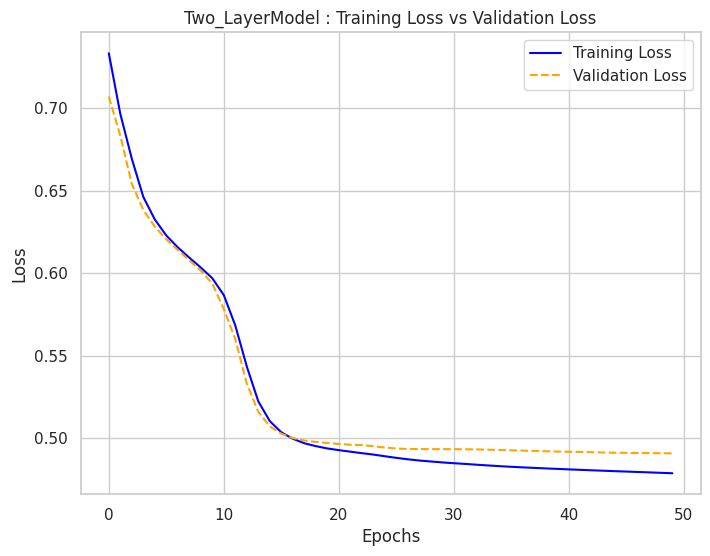

In [ ]:
Plot_Loss(history_2,'Two_LayerModel')

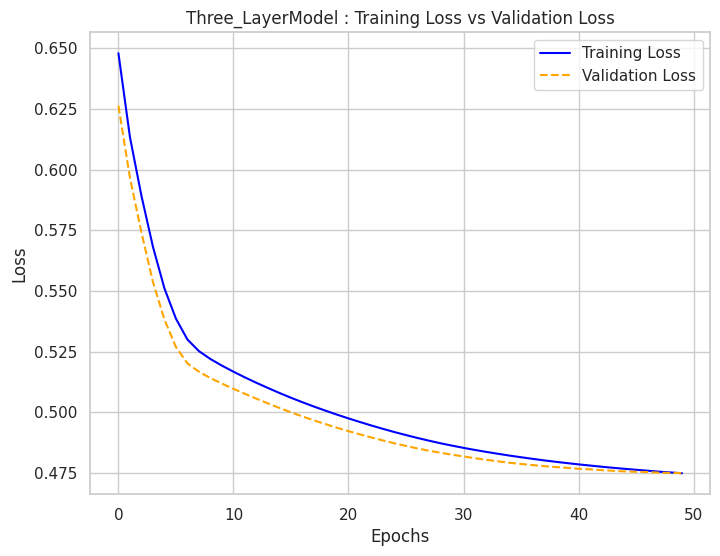

In [ ]:
Plot_Loss(history_3,'Three_LayerModel')

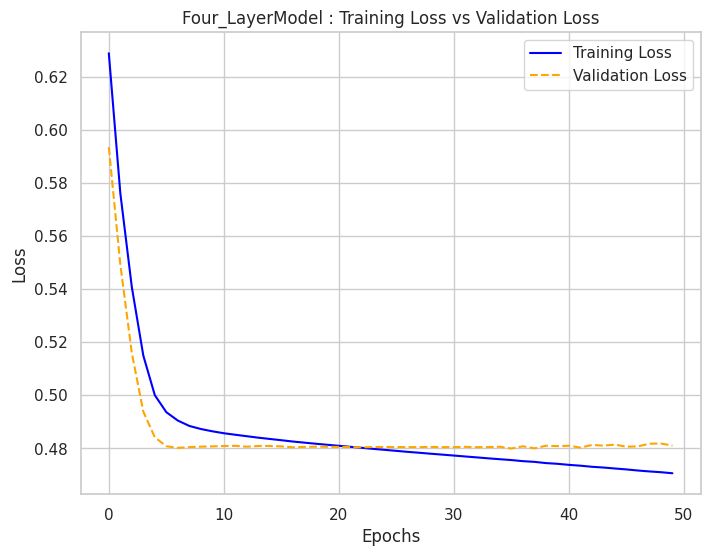

In [ ]:
Plot_Loss(history_4,'Four_LayerModel')

It is easy to notice how the **$4$ Layer Model** starts to *overfit* for $Epochs \approx 5$. It is also the model with the Minimum value for the **Loss**.

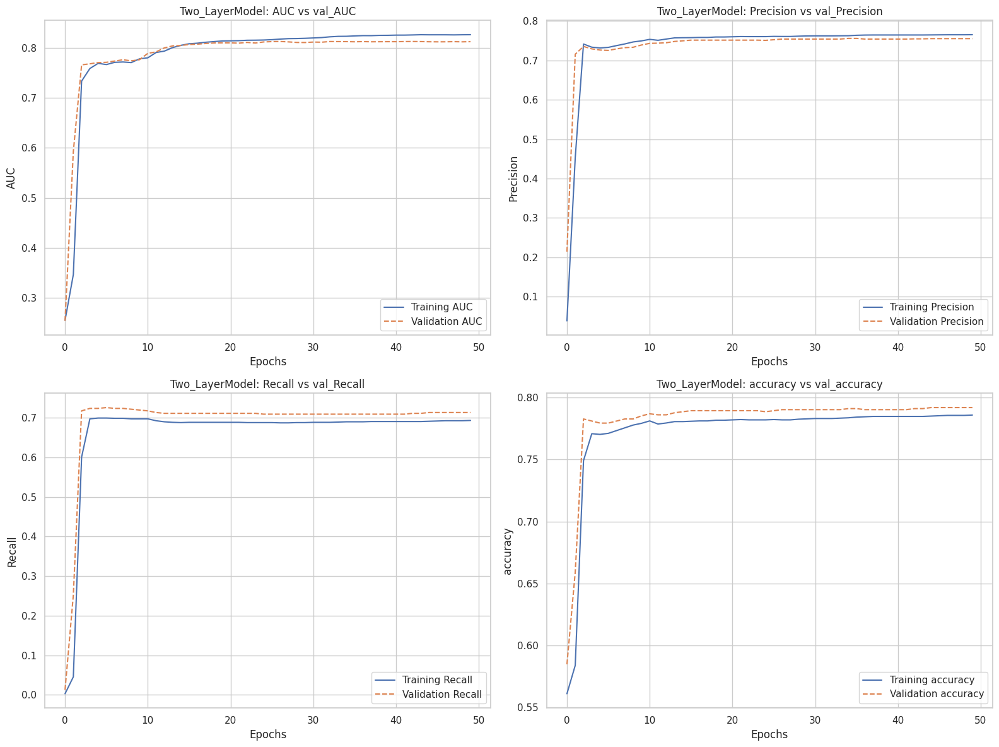

In [ ]:
Plot_Metrics(history_2, 'Two_LayerModel')

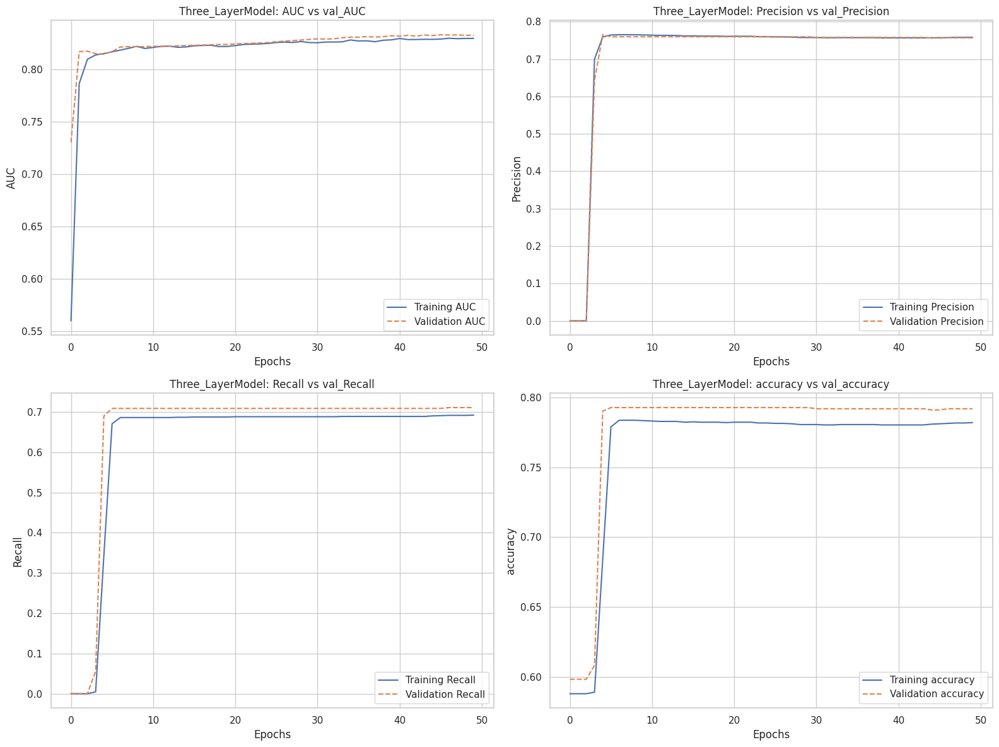

In [ ]:
Plot_Metrics(history_3, 'Three_LayerModel')

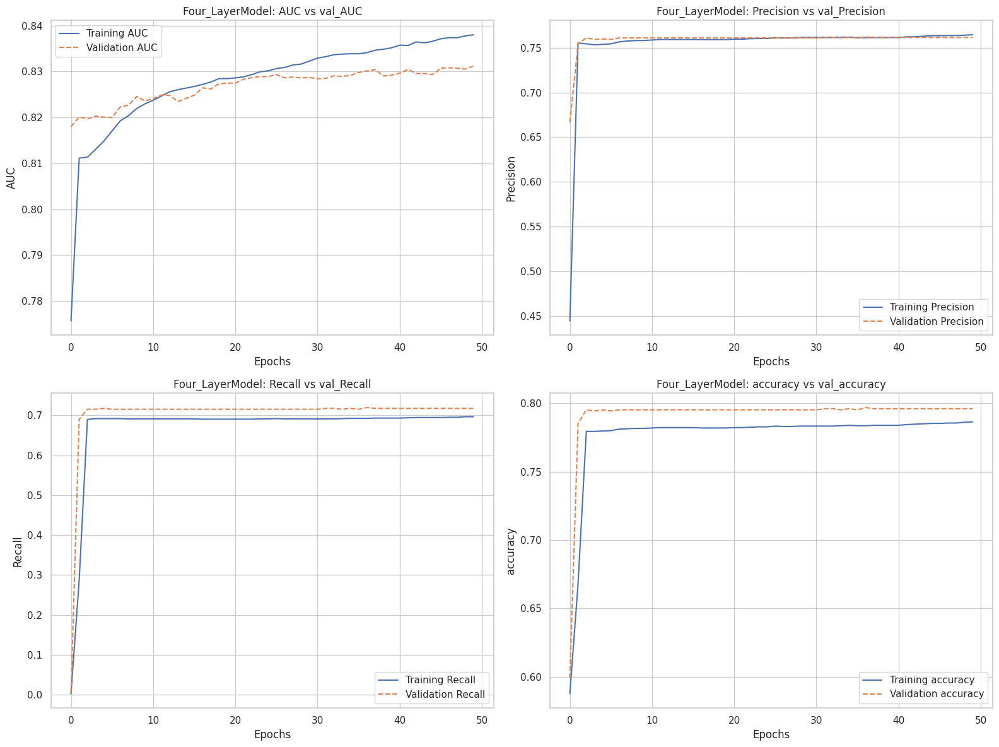

In [ ]:
Plot_Metrics(history_4, 'Four_LayerModel')

In order to improve the **robustness** of th choosen model, one can apply the **K-Fold Cross Validation**.

Besides, since the NN performs almost like the Logistic Regression, it is more convinient to choose the latter as the best one because of its higher interpretability.

#### Conclusions

##### Model Comparison

In [ ]:
Results_df = pd.DataFrame([Logistic_results, ComplementNB_results, MNB__results,Logistic_results_w2v]).round(2)

In [ ]:
Results_df

,Model,Score,Recall,Precision,F1
0,Logistic Regression,0.79,0.80,0.71,0.75
1,Complement Naive Bayes,0.75,0.88,0.63,0.73
2,Multinomial Naive Bayes,0.79,0.78,0.71,0.75
3,Logistic Regression (w2v),0.80,0.72,0.75,0.73


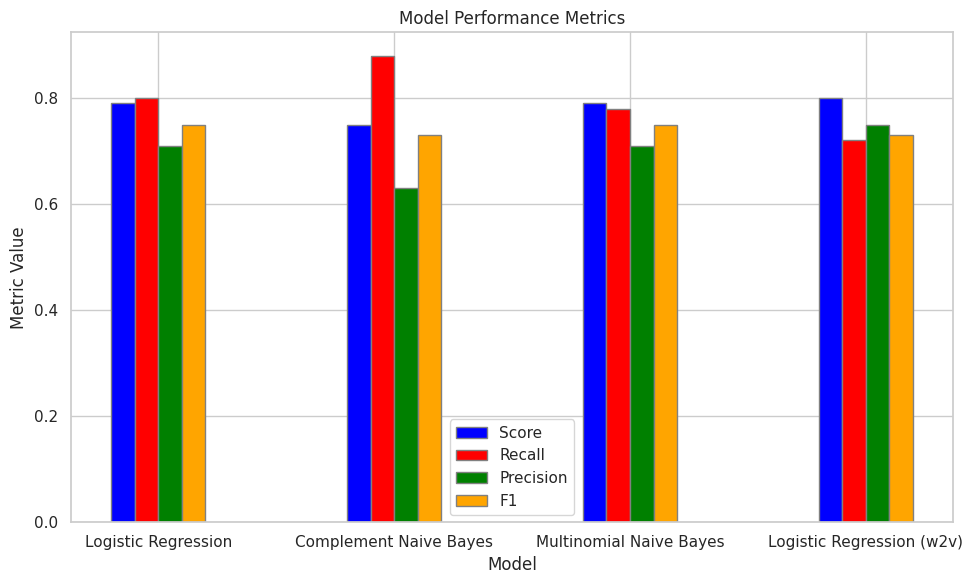

In [ ]:
plot_model_metrics(Results_df)

*  **Complement Naive Byes** model performs better than the others for the **Recall** metric ;
* **Logistic Regression** and **Multinomial Naive Bayes** perform in much the same way .



At this point we can finally give a more accurate answer to the previous question and others too :

* **Which model should i consider for a Classification Task?**

The main consequence of the **Conditional Indipendence** also known as **Naive Bayes Assumption**, is that the **Correlation** between features are **not taken into account**.

On the other hand, the **Logistic Regression** manages the **linear** correlation between features by assigning the **Optimal Weights** to them. Keep always in mind that both models are linear ones.

For example , in order to be more specific, lets' consider two **linearly correlated** features w.r.t the *Pearson's correlation coefficient "$ρ$"* :

1. $$f_1,f_2 : ρ_{f_1f_2}=corr(f_1,f_2)= \frac{cov(f_1,f_2)}{var(f_1)⋅var(f_2)}\ne 0  $$

Remember that, in general, the presence of a correlation is not sufficient to infer the presence of a causal relationship, so **correlation does not imply causation** especially if the considered one is only sensitive only a linear relationship between the two variables :

2. $ρ_{f_1f_2} = 0 \not⇒ f_1,f_2
 $ are **Indipendent**


The **opposite implication**, on the other hand, is **True** :

3. $ f_1,f_2
 $ **Indipendency** $\implies ρ_{f_1f_2} = 0$

It happens too often that there is confusion on the topic due the fact that in the informal parlance, both because correlation is synonymous with dependence and because in the broadest sense, correlation may indicate any type of association.

The dependence or independence between two variables can only be expressed in **Probabilistic terms**, which is a direct consequence of the axioms of Probability Theory.

4. $ f_1,f_2
 $ are **Indipendent** $ \Leftrightarrow  P(f_1,f_2) = P(f_1)\cdot P(f_2) $

Otherwise, for **any type** of Dependency between the variables, we have :

5. $$P(f_1,f_2) =  P(f_1)\cdot P(f_1\mid f_2)≡ P(f_2)\cdot P(f_2\mid f_1)$$

Basically in the Naive Bayes approach we do not even try to evaluate the impact of the  $(5)$, we directly assume that the $(4)$ is true! This is why, as already seen in NB section before, we compute :
* $$P(f_1,..,f_K|c) = \prod_{j=1}^{K}P(f_j|c)$$


The Logistic Regression instead handles well the validity of the relation $(5)$ to the same extent that the relation itself  is valid **only** due to a linear association between the data.


At this point i hope that the reason why the Naive assumption is pretty **Strong** to do is clear, otherwise in the following i will show an example considering our case study.

Lets'consider for example three possible tweets $d_1,d_2,d_3$ such that :
* $d_1=$  "I love Salvini, the islamic people must go away, they act like animals !";
* $d_2 =$ "Salvini save us from these muslims, they are just criminals." ;
* $d_3=$ "Salvini is totally wrong, every single human being has equal rights, our country has sooo many other problems !".

Since also humans are good classifiers, it is easy to understand that $d_1,d_2$ belongs for sure to the $hs,st = 1,1$ classes, while $d_3$ belongs of course to $hs,st = 0,0$ classes.

On the basis of these considerations,i have a question for you:
"don't you think that considering that $P(d_1|c = 1),P(d_2|c = 1),P(d_3|c = 0)$ are independent is a very strong assumption?" Of course it is.

We can say that the first two tweets contain the same **information** or similarly we can say that, choosen the optimal Text Vectorization method, $d_1$ and $d_2$ should be mapped roughly to the **same vector**.

A severe consequence of "*considering the same things as different things*" in probabilistic terms it means that we may **Overstimate** the **Evidence** and so that :

* $$\operatorname*{arg\,max}_{c \in C} P(f_1,...,f_K|c)⋅ P(c)= \hat{c} \le c_{NB} = \operatorname*{arg\,max}_{c \in C} P(c)⋅\prod_{j=1}^{K}P(f_j|c)  $$

On the other hand the Logistic Regression, in the same situation, avoid this problem by properly distributing the weights to linearly related features, this is also the reason way the LR model is **Highly Interpretable** .

I hope it is clear that all this reasoning is crucial to take an important step in determining which model to choose for classification.

* **Why in this case the NB model performs pretty the same way as the LR model?**

There can be multiple answers for this question, for example we know that in general the LR overperforms NB on larger dataset, a certain amount of data is needed to properly train a model. Obviously, on the other hand, the NB model works pretty good on small. Since our dataset is medium-small , lets' say that the models play on "*equal terms*".

Another line of reasoning concerns the **Degree of Feature Dependency**. Probably they works equally well because the Naive assumption is not too brutal due an higher presence of **Non linear** relations w.r.t. linear ones. In this case, since the LR is also linear (*repetita iuvant* said the latin) both models play "*away from home* " .


* **Since they perform equally well, is one worth the other?**

Absolutely not, their nature is completely different. As already said in the beginning, NB allow us to **generate** new document given the class, besides the LR it's more easily interpretable, in fact it allow us to understand wich are the most important features used to **discriminate** the classes of the target variable.

In [ ]:
# Create a DataFrame
weights_df = pd.DataFrame({'Feature': feature_names, 'Weight': feature_weights})

(type(feature_names),feature_names.shape), (type(feature_weights),feature_weights.shape)

((numpy.ndarray, (18022,)), (numpy.ndarray, (18022,)))

In [ ]:
# Sort the weights by magnitude (absolute value) for the Plot
weights_df['AbsWeight'] = np.abs(weights_df['Weight'])
weights_df = weights_df.sort_values(by='AbsWeight', ascending=False).reset_index(drop=True)
weights_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18022 entries, 0 to 18021
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Feature    18022 non-null  object 
 1   Weight     18022 non-null  float64
 2   AbsWeight  18022 non-null  float64
dtypes: float64(2), object(1)
memory usage: 422.5+ KB


* Before Plotting, in the follwoing the **Top 10** most important features.

In [ ]:
weights_df[['Feature','AbsWeight']][:10].round(2)

,Feature,AbsWeight
0,rom,7.92
1,nomadi,4.62
2,roma,4.25
3,migranti,3.65
4,terrorismo,3.21
5,immigrazione,3.08
6,basta,2.75
7,milano,2.68
8,nomade,2.64
9,trump,2.22


* Now lets' plot the top 25 most important features:

In [ ]:
weights_df_top25 = weights_df[['Feature','AbsWeight']][:25]

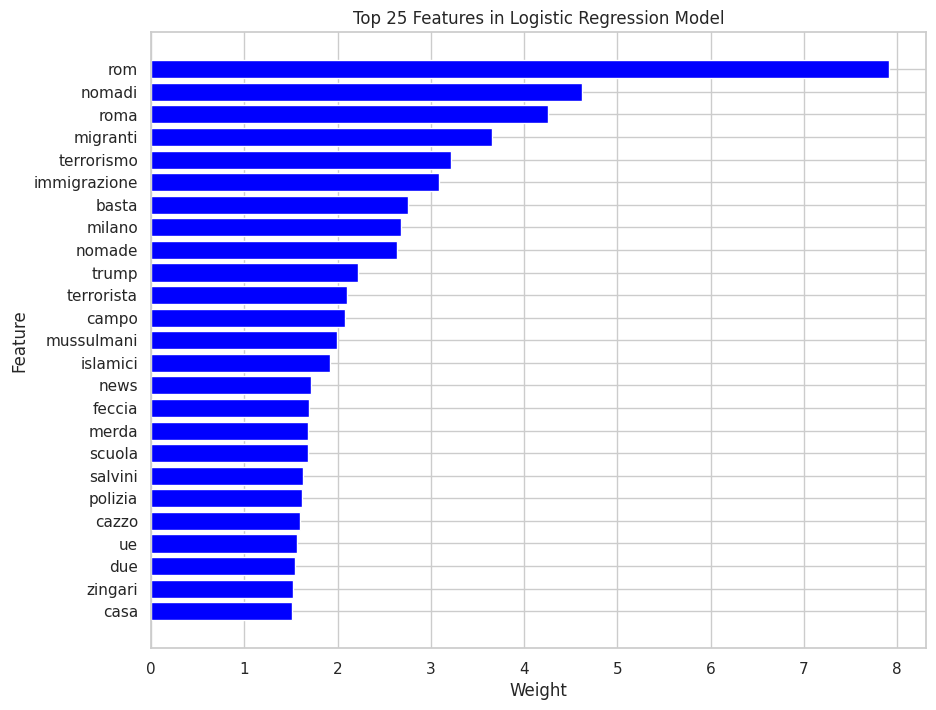

In [ ]:
# Plot
plt.figure(figsize=(10, 8))
plt.barh(weights_df_top25['Feature'], weights_df_top25['AbsWeight'], color='blue')
plt.xlabel('Weight')
plt.ylabel('Feature')
plt.title('Top 25 Features in Logistic Regression Model')
plt.gca().invert_yaxis()
plt.show()

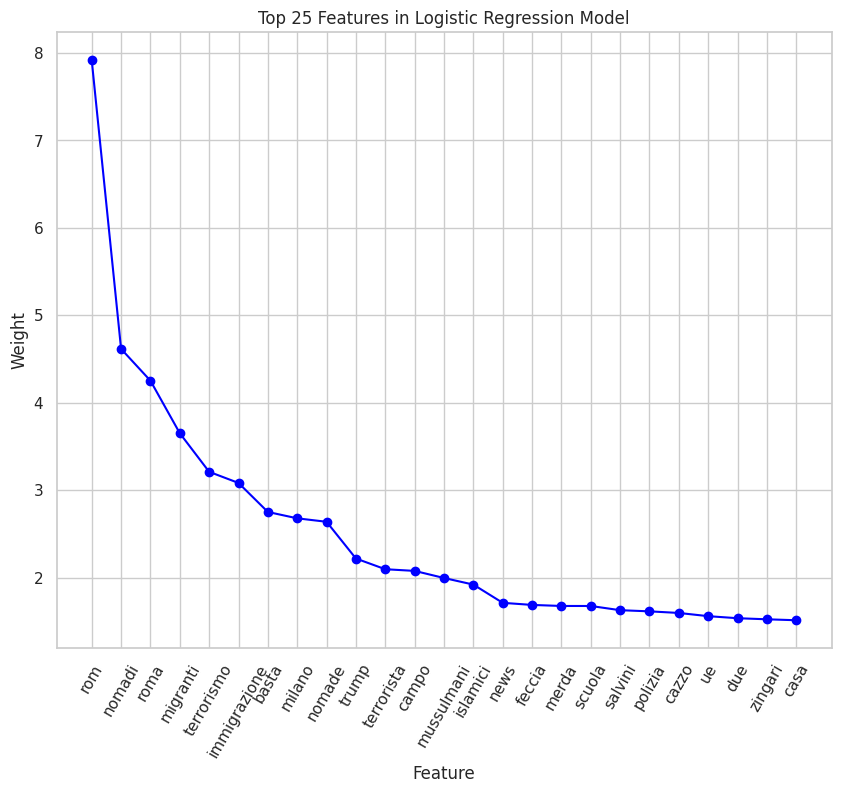

In [ ]:
plt.figure(figsize=(10, 8))

plt.plot(weights_df_top25['Feature'], weights_df_top25['AbsWeight'], color='blue')
plt.scatter(weights_df_top25['Feature'], weights_df_top25['AbsWeight'], color='blue')

plt.xlabel('Feature')
plt.xticks(rotation=60)
plt.ylabel('Weight')
plt.title('Top 25 Features in Logistic Regression Model')
plt.show()

From the graph of the 25 most relevant features for classification purposes, it is clear how the tweets express strong hatred and little tolerance for Islamic, Romanian and Muslim minorities, the word "basta" for example means "stop/enough". It is once again clear how this attitude is based on the prejudice that these people are associated with crime and terrorism.

Finally it is intersting to notice that the rougher version of the plot above had already been obtained earlier by **simply** analysing the Unigrams.

<Axes: xlabel='Samples', ylabel='Counts'>

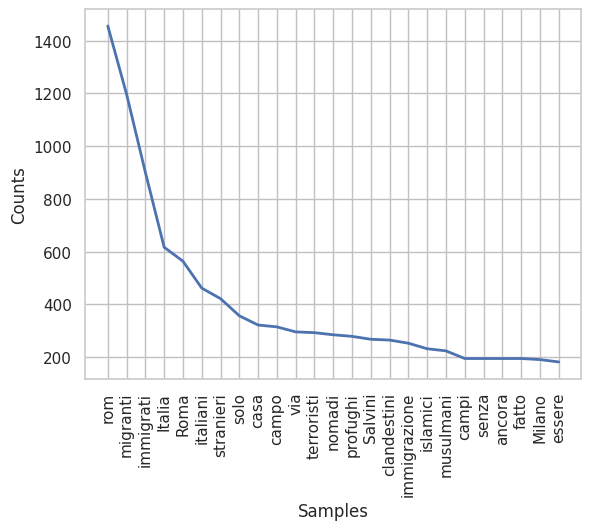

In [ ]:
Unigrams.plot(25, cumulative=False)

* **What happened to the stereotype features?**

In [ ]:
weights_df.loc[weights_df['Feature'] == 'stereotype', ['Feature', 'AbsWeight']].round(2)

,Feature,AbsWeight
28,stereotype,1.41


##### Significance Test

In order to increase the validity about the model performances, it is opportune to apply a **Statistical Significance Testing**. Since we do not know the pdf which describes the test data distribution, we can not do any *a priori* assumption about that, so we are going to use a **non-parametric test** based on **sampling** called **Bootstrap**.

It is important to underline that this approach works only if the assumption that each sample generated is **Rappresentative** of the population.

In our specific case, in according to the code below, our $H_0$ hypotesis is based on the statement :

> **The LR is better than MNB**

Due this condition, we espect that the value of the **Effective Size** parameter should be greater than zero in the vast majority of the Sampled dataset.

Furthermore, the probability that such condition is verified is called **P-value**.It is simply computed as the ratio between the number of times that the pervious statment is statisfied and the number of sample generated with the Bootstrap.

In [ ]:
n_samples = 50 # 100 is very expensive, free colab is not enough...
sample_size = len(tfidf_df)

In [ ]:
LogisticR_model_sample = LogisticRegression(penalty = 'l2',
                                            random_state = 42,
                                            solver = 'lbfgs',
                                            max_iter = 1000,
                                            fit_intercept = False)

In [ ]:
MNB_model_sample = MultinomialNB(fit_prior = True)

In [ ]:
tfidf_df.shape

(6837, 18023)

In [ ]:
# Pre-compute the original effect size
Effect_Size = Logistic_results['Score'] - MNB__results['Score']
print(f'Effect Size: {Effect_Size}')

Effect Size: 0.0


In [ ]:
s = 0  # Count of bootstrap samples satisfying the condition

for sample in range(n_samples):
    # Create a bootstrap sample by sampling indices with replacement
    new_sample = tfidf_df.sample(n = sample_size, replace=True)
    X = new_sample.drop(['Target_hs'], axis = 1)
    y = new_sample['Target_hs']
    X_train, X_val, X_test, y_train, y_val, y_test = df_Splitting(X, y,
                                                              val_size = 0.25,
                                                              test_size = 0.3,
                                                              random_state = 42,
                                                              show_sample = False)

    X_train_virtual = pd.concat([X_train, X_val], axis=0).reset_index(drop=True)

    y_train_virtual = pd.concat([y_train, y_val], axis=0).reset_index(drop=True)

    # Train the models
    MNB_fitted_model_sample = MNB_model.fit(X_train_virtual, y_train_virtual)
    LogisticR_fitted_model_sample = LogisticR_model_sample.fit(X_train_virtual, y_train_virtual)


    # Predict on the bootstrap sample(usefull for other metrics)
    LogisticR_sample_predicted_labels = MNB_fitted_model_sample.predict(X_test)
    MNB_sample_predicted_labels = LogisticR_fitted_model_sample.predict(X_test)

    # Compute accuracy on the bootstrap sample
    LogisticR_sample_accuracy = LogisticR_model.score(X_test, y_test)
    MNB_sample_accuracy = MNB_model.score(X_test, y_test)

    # Compute effect size for this bootstrap sample
    effect_size_sample = LogisticR_sample_accuracy - MNB_sample_accuracy

    # Check the condition for the null hypothesis
    if effect_size_sample >= 2 * Effect_Size:
        s += 1

In [ ]:
# Compute the p-value
p_val = s / n_samples

In [ ]:
print(f'P-Value: {p_val * 100} %')

P-Value: 34.0 %


Usually the treshold for rejecting the null hypotesis $H_0$ is $P_{val} \leq 0.05$, in our case, although one should generate at least thousand of sample, we can state that the $H_0$ is not rejected and so the **LR** model is better than **MNB** one.

Of course it is possible to apply the same significance test for each metric used to evaluate performances of the models.

#### Further Analysis

In Further Analysis it can be really intersting to evaluate the model performances without considering the *streotype* variable, in this way the models depends only on the **Feauturing Techniques** applied for Text Vectorization.

In first place we can immagine that the performance of the model may drop a little due the fact that *stereotype* is the 28th most important feature.

# Bibliography

In addition to the references already linked on the way, I have referred to the following books for theoretical excursus:

* Bishop, Christopher M. *Pattern Recognition and Machine Learning*. 2nd ed., Springer, 2023.

* Daniel Jurafsky and James H. Martin. 2024. *Speech and Language Processing: An Introduction to Natural Language Processing, Computational Linguistics, and Speech Recognition with Language Models*, 3rd edition.

Of coruse, to avoid burdening the discussion, not all the mathematical steps have been reported. I invite the reader to take a look at the books for further information.
